# TM-scoring using USalign

Here we are going to explore how to use USalign to score the TM-score of protein
structures. We will implement this on our chimeric motors to explore the
differences in protein strurcture that might lead to different phenotypes in
ActiveDROPS. 

https://github.com/pylelab/USalign

This is a command line tool, so we can implement it like this:



In [ ]:
!USalign ~/git/activedrops/data/3d_predictions/prodigy/a_55_chainA.pdb ~/git/activedrops/data/3d_predictions/prodigy/h_44_chainA.pdb

However we can also write a small script to run it, which is better for now to
stay in the notebook and make more changes.

In [ ]:
import subprocess

# Define the paths to your PDB files

structure1 = "../../data/3d_predictions/prodigy/a_55.pdb"
structure2 = "../../data/3d_predictions/prodigy/h_44.pdb"
# structure3 = "../../data/3d_predictions/prodigy/c_123.pdb"


# Execute the USalign command
result = subprocess.run(
    ["USalign", structure1, structure2],
    stdout=subprocess.PIPE,
    stderr=subprocess.PIPE,
    text=True
)

# Print the output
print(result.stdout)

# Check for errors
if result.stderr:
    print("Error:", result.stderr)

This is great, but now let's add some modifications to select the residues we
want to compare.

In [ ]:
import subprocess
from Bio.PDB import PDBParser, PDBIO, Select

# Define a custom Select class to filter residues
class ResidueRangeSelect(Select):
    def __init__(self, start_residue, end_residue):
        self.start_residue = start_residue
        self.end_residue = end_residue

    def accept_residue(self, residue):
        res_id = residue.get_id()[1]
        return self.start_residue <= res_id <= self.end_residue

# Function to extract specified residue range from a PDB file
def extract_residue_range(input_pdb, output_pdb, start_residue, end_residue):
    parser = PDBParser(QUIET=True)
    structure = parser.get_structure('structure', input_pdb)
    io = PDBIO()
    io.set_structure(structure)
    io.save(output_pdb, ResidueRangeSelect(start_residue, end_residue))

# Paths to your original PDB files
structure1_path = "../../data/3d_predictions/prodigy/a_55.pdb"
structure2_path = "../../data/3d_predictions/prodigy/h_44.pdb"

# Paths for the trimmed PDB files
trimmed_structure1 = "a_55_trimmed.pdb"
trimmed_structure2 = "h_44_trimmed.pdb"

# Define the residue range to extract
start_residue = 9
end_residue = 12

# Extract the specified residue range from both structures
extract_residue_range(structure1_path, trimmed_structure1, start_residue, end_residue)
extract_residue_range(structure2_path, trimmed_structure2, start_residue, end_residue)

# Execute the US-align command on the trimmed structures
result = subprocess.run(
    ["USalign", trimmed_structure1, trimmed_structure2],
    stdout=subprocess.PIPE,
    stderr=subprocess.PIPE,
    text=True
)

# Print the output
print(result.stdout)

# Check for errors
if result.stderr:
    print("Error:", result.stderr)

Cool, now let's add the sequence identity to the output.

In [ ]:
import os
import subprocess
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select

class ResidueRangeSelect(Select):
    def __init__(self, residue_ids_to_keep):
        self.residue_ids_to_keep = residue_ids_to_keep

    def accept_residue(self, residue):
        return residue.get_id()[1] in self.residue_ids_to_keep

def extract_aligned_sequences(output):
    lines = output.splitlines()
    seq1, seq2 = "", ""
    i = 0
    while i < len(lines) - 2:
        top = lines[i].strip()
        mid = lines[i + 1].strip()
        bot = lines[i + 2].strip()
        if (
            top and bot and
            all(c.isalpha() or c == '-' for c in top) and
            all(c.isalpha() or c == '-' for c in bot) and
            set(mid) <= set(": .")
        ):
            seq1 += top
            seq2 += bot
            i += 3
        else:
            i += 1
    return seq1, seq2

def extract_residue_id_map(aligned_seq, structure_path):
    ext = os.path.splitext(structure_path)[1].lower()
    parser = MMCIFParser(QUIET=True) if ext == ".cif" else PDBParser(QUIET=True)
    structure = parser.get_structure('structure', structure_path)
    residues = [res for res in structure.get_residues()]
    residue_ids = [res.get_id()[1] for res in residues]
    id_map = []
    index = 0
    for c in aligned_seq:
        if c != '-':
            id_map.append(residue_ids[index])
            index += 1
        else:
            id_map.append(None)
    return id_map

def align_structures(structure1_path, structure2_path, start_index, end_index):
    # Initial alignment to get full aligned sequences
    result = subprocess.run(
        ["USalign", structure1_path, structure2_path],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True
    )

    output = result.stdout
    seq1, seq2 = extract_aligned_sequences(output)
    id_map1 = extract_residue_id_map(seq1, structure1_path)
    id_map2 = extract_residue_id_map(seq2, structure2_path)

    residues1_to_keep = [id_map1[i] for i in range(start_index, end_index+1) if id_map1[i] is not None]
    residues2_to_keep = [id_map2[i] for i in range(start_index, end_index+1) if id_map2[i] is not None]

    # Trim and save new PDBs
    trimmed_dir = "trimmed_structures"
    os.makedirs(trimmed_dir, exist_ok=True)

    base1 = os.path.splitext(os.path.basename(structure1_path))[0]
    base2 = os.path.splitext(os.path.basename(structure2_path))[0]
    trimmed1 = os.path.join(trimmed_dir, f"{base1}_custom_trim.pdb")
    trimmed2 = os.path.join(trimmed_dir, f"{base2}_custom_trim.pdb")

    ext1 = os.path.splitext(structure1_path)[1].lower()
    parser1 = MMCIFParser(QUIET=True) if ext1 == ".cif" else PDBParser(QUIET=True)
    io = PDBIO()

    structure1 = parser1.get_structure('s1', structure1_path)
    io.set_structure(structure1)
    io.save(trimmed1, ResidueRangeSelect(residues1_to_keep))

    ext2 = os.path.splitext(structure2_path)[1].lower()
    parser2 = MMCIFParser(QUIET=True) if ext2 == ".cif" else PDBParser(QUIET=True)

    structure2 = parser2.get_structure('s2', structure2_path)
    io.set_structure(structure2)
    io.save(trimmed2, ResidueRangeSelect(residues2_to_keep))

    # Final alignment on trimmed structures
    final_result = subprocess.run(
        ["USalign", trimmed1, trimmed2],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True
    )

    print(final_result.stdout)
    if final_result.stderr:
        print("Error:", final_result.stderr)

    return final_result.stdout

# Example usage
structure1_path = "../../data/3d_predictions/prodigy/a_55.pdb"
structure2_path = "../../data/3d_predictions/prodigy/h_44.pdb"
start_index = 95
end_index = 103

align_structures(structure1_path, structure2_path, start_index, end_index)

Ok cool. Also notice that even though the .pdb files contain many other chains
(kinesin dimer, tubulin, etc), USalign only uses chain A by default. Ok what we
want now is to make a little matrix where we compare all 8 sequences... maybe
even two heatmaps? One for the TM-score and one for the sequence identity.

In [ ]:
import os
import subprocess
import pandas as pd
from tqdm import tqdm
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select

class ChainAResidueSelect(Select):
    def __init__(self, residue_ids_to_keep):
        self.residue_ids_to_keep = residue_ids_to_keep

    def accept_residue(self, residue):
        return residue.get_parent().id == "A" and residue.get_id()[1] in self.residue_ids_to_keep

def extract_aligned_sequences(output):
    lines = output.splitlines()
    seq1, seq2 = "", ""
    i = 0
    while i < len(lines) - 2:
        top = lines[i].strip()
        mid = lines[i + 1].strip()
        bot = lines[i + 2].strip()
        if (
            top and bot and
            all(c.isalpha() or c == '-' for c in top) and
            all(c.isalpha() or c == '-' for c in bot) and
            set(mid) <= set(": .")
        ):
            seq1 += top
            seq2 += bot
            i += 3
        else:
            i += 1
    return seq1, seq2

def extract_residue_id_map(aligned_seq, structure_path):
    ext = os.path.splitext(structure_path)[1].lower()
    parser = MMCIFParser(QUIET=True) if ext == ".cif" else PDBParser(QUIET=True)
    structure = parser.get_structure('structure', structure_path)
    residues = [res for res in structure.get_residues() if res.get_parent().id == "A"]
    residue_ids = [res.get_id()[1] for res in residues]
    id_map = []
    index = 0
    for c in aligned_seq:
        if c != '-':
            id_map.append(residue_ids[index])
            index += 1
        else:
            id_map.append(None)
    return id_map

def extract_residue_range_by_alignment_index(structure1_path, structure2_path, start_index, end_index):
    result = subprocess.run(
        ["USalign", structure1_path, structure2_path],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True
    )
    seq1, seq2 = extract_aligned_sequences(result.stdout)
    id_map1 = extract_residue_id_map(seq1, structure1_path)
    id_map2 = extract_residue_id_map(seq2, structure2_path)

    residues1_to_keep = [id_map1[i] for i in range(start_index, end_index+1) if id_map1[i] is not None]
    residues2_to_keep = [id_map2[i] for i in range(start_index, end_index+1) if id_map2[i] is not None]

    return residues1_to_keep, residues2_to_keep, seq1, seq2

def extract_residue_range(input_structure, output_pdb, residues_to_keep):
    ext = os.path.splitext(input_structure)[1].lower()
    parser = MMCIFParser(QUIET=True) if ext == ".cif" else PDBParser(QUIET=True)
    structure = parser.get_structure('structure', input_structure)
    io = PDBIO()
    io.set_structure(structure)
    io.save(output_pdb, ChainAResidueSelect(residues_to_keep))

def parse_usalign_output(output):
    tm_score = None
    seq_id = None
    for line in output.splitlines():
        if line.startswith("TM-score=") and tm_score is None:
            try:
                tm_score = float(line.split('=')[1].split()[0])
            except (IndexError, ValueError):
                continue
        elif "Seq_ID=n_identical/n_aligned=" in line:
            try:
                seq_id = float(line.split("Seq_ID=n_identical/n_aligned=")[1].strip())
            except (IndexError, ValueError):
                continue
    return tm_score, seq_id

def align_structures(structure1_path, structure2_path, start_index, end_index):
    trimmed_dir1 = os.path.join(os.path.dirname(structure1_path), "trimmed_structures")
    trimmed_dir2 = os.path.join(os.path.dirname(structure2_path), "trimmed_structures")
    os.makedirs(trimmed_dir1, exist_ok=True)
    os.makedirs(trimmed_dir2, exist_ok=True)

    base1 = os.path.splitext(os.path.basename(structure1_path))[0]
    base2 = os.path.splitext(os.path.basename(structure2_path))[0]
    trimmed1 = os.path.join(trimmed_dir1, f"{base1}_trimmed_{start_index}_{end_index}.pdb")
    trimmed2 = os.path.join(trimmed_dir2, f"{base2}_trimmed_{start_index}_{end_index}.pdb")

    residues1, residues2, seq1, seq2 = extract_residue_range_by_alignment_index(structure1_path, structure2_path, start_index, end_index)

    extract_residue_range(structure1_path, trimmed1, residues1)
    extract_residue_range(structure2_path, trimmed2, residues2)

    result = subprocess.run(
        ["USalign", trimmed1, trimmed2],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True
    )

    tm_score, seq_id = parse_usalign_output(result.stdout)
    return tm_score, seq_id, seq1, seq2

def compute_matrices(structure_paths, start_index, end_index):
    names = [os.path.splitext(os.path.basename(p))[0] for p in structure_paths]
    tm_scores = pd.DataFrame(index=names, columns=names, dtype=float)
    seq_ids = pd.DataFrame(index=names, columns=names, dtype=float)
    aligned_sequences = {}  # Dict of tuples: (name1, name2) -> (seq1, seq2)

    total = len(structure_paths) ** 2
    with tqdm(total=total, desc="Computing pairwise USalign") as pbar:
        for i, path1 in enumerate(structure_paths):
            for j, path2 in enumerate(structure_paths):
                tm_score, seq_id, seq1, seq2 = align_structures(path1, path2, start_index, end_index)
                tm_scores.iloc[i, j] = tm_score
                seq_ids.iloc[i, j] = seq_id
                aligned_sequences[(names[i], names[j])] = (seq1, seq2)
                pbar.update(1)

    return tm_scores, seq_ids, aligned_sequences

# ==== USAGE ====

structure_paths = [
    "../../data/3d_predictions/prodigy/a_55.pdb",
    # "../../data/3d_predictions/prodigy/b_345.pdb",
    # "../../data/3d_predictions/prodigy/c_123.pdb",
    # "../../data/3d_predictions/prodigy/d_55.pdb",
    # "../../data/3d_predictions/prodigy/e_234.pdb",
    # "../../data/3d_predictions/prodigy/f_456.pdb",
    # "../../data/3d_predictions/prodigy/g_123.pdb",


    "../../data/3d_predictions/prodigy/kif5_11.cif",
    "../../data/3d_predictions/prodigy/thtr_trimmed.pdb",
    "../../data/3d_predictions/prodigy/adpa_11.cif",
    "../../data/3d_predictions/prodigy/nagr_11.cif",
    "../../data/3d_predictions/prodigy/acsu2_11.cif",
    "../../data/3d_predictions/prodigy/dipu_11.cif",
    "../../data/3d_predictions/prodigy/heal_11.cif",
    "../../data/3d_predictions/prodigy/tila_11.cif",


    "../../data/3d_predictions/prodigy/h_44.pdb",

]

start_index = 0
end_index = 391

tm_matrix, seqid_matrix, aligned_seqs = compute_matrices(structure_paths, start_index, end_index)

print("\nTM-score matrix:")
print(tm_matrix.round(3))

print("\nSequence identity matrix:")
print(seqid_matrix.round(3))

# # Print aligned sequences
# print("\nAligned Sequences:")
# for (name1, name2), (seq1, seq2) in aligned_seqs.items():
#     print(f"\n{name1} vs {name2}")
#     print(seq1)
#     print(seq2)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the matplotlib figure
plt.figure(figsize=(20, 10))

# Plot TM-score heatmap
plt.subplot(1, 2, 1)
sns.heatmap(tm_matrix, annot=True, fmt=".3f", cmap="viridis", cbar_kws={'label': 'TM-score'}, vmin=0, vmax=1)
plt.title("TM-score Heatmap")
plt.xlabel("Structure")
plt.ylabel("Structure")

# Plot Sequence Identity heatmap
plt.subplot(1, 2, 2)
sns.heatmap(seqid_matrix, annot=True, fmt=".3f", cmap="viridis", cbar_kws={'label': 'Sequence Identity'}, vmin=0, vmax=1)
plt.title("Sequence Identity Heatmap")
plt.xlabel("Structure")
plt.ylabel("Structure")

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
# --- DOMAIN REGION ANALYSIS ---

domain_ranges = {
    "b0-a0": (0, 28),
    "b2": (34, 72),
    "a1": (58, 95),
    "b3": (82, 108),
    "ploop": (85, 113),
    "L5": (97, 129),
    "a2": (110, 144),
    "b4": (129, 161),
    "b5-L8": (144, 188),
    "a3": (179, 213),
    "L9-SwI": (194, 227),
    "b6": (208, 239),
    "b7": (223, 254),
    "L11-SwII": (234, 268),
    "a4": (249, 293),
    "L12": (274, 304),
    "a5": (285, 313),
    "b8": (299, 326),
    "a6": (313, 348),
    "neck": (329, 361),
    "coiled-coil": (352, 624),
}

for region, (start_index, end_index) in domain_ranges.items():
    print(f"Computing for region: {region} ({start_index}-{end_index})")
    tm_matrix, seqid_matrix, *_ = compute_matrices(structure_paths, start_index, end_index)
    import matplotlib.pyplot as plt
    import seaborn as sns
    plt.figure(figsize=(20, 10))
    # TM-score heatmap
    plt.subplot(1, 2, 1)
    sns.heatmap(tm_matrix, annot=True, fmt=".3f", cmap="viridis", cbar_kws={'label': 'TM-score'}, vmin=0, vmax=1)
    plt.title(f"TM-score Heatmap: {region} ({start_index}-{end_index})")
    plt.xlabel("Structure")
    plt.ylabel("Structure")
    # Sequence Identity heatmap
    plt.subplot(1, 2, 2)
    sns.heatmap(seqid_matrix, annot=True, fmt=".3f", cmap="viridis", cbar_kws={'label': 'Sequence Identity'}, vmin=0, vmax=1)
    plt.title(f"Sequence Identity Heatmap: {region} ({start_index}-{end_index})")
    plt.xlabel("Structure")
    plt.ylabel("Structure")
    plt.tight_layout()
    plt.show()

In [ ]:
amino_acid_groups = {
    'Nonpolar': {'R', 'K', 'D', 'E'},
    'polar': {'Q', 'N', 'H', 'S', 'T', 'Y', 'C'},
    'hydrophobic': {'A', 'I', 'L', 'M', 'F', 'V', 'W'},
    'special': {'G', 'P'}
}

Correctted version of the code. Prevviously the range selection was not working
properly.

Now for multiple structures

In [87]:
import os
import subprocess
import pandas as pd
from tqdm import tqdm
from Bio import pairwise2
from Bio.Seq import Seq
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select, PPBuilder
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------- Domain Sequences -------------------
domain_sequences = {
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5-a2": "GVIGDSVKQGIIPRIVNDIFNHIYA",
    "b4-L8-b5": "LEFHIKVSYYEIYKIRDLLDVSKVNLSVHEDKNRVPYV",
    "L9-SwI": "PEDVFEVIEEGKSNRHIAVTNMNEHSSRS",
    "b6-b7": "HSVFLINVKQENLEQKKLSGKLYLVD",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12-a5": "GNKTHIPYRDSKLTRILQES",
    "b8-a6": "RTTIVICCSPASFNESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# ------------------- Utility: Structure & Sequence -------------------
def extract_sequence_and_residues(structure_path):
    ext = os.path.splitext(structure_path)[1].lower()
    parser = MMCIFParser(QUIET=True) if ext == ".cif" else PDBParser(QUIET=True)
    structure = parser.get_structure("model", structure_path)
    ppb = PPBuilder()
    sequence = ""
    residue_list = []
    for pp in ppb.build_peptides(structure):
        seq = str(pp.get_sequence())
        res = [res for res in pp]
        sequence += seq
        residue_list += res
    residue_id_map = {i: r.get_id()[1] for i, r in enumerate(residue_list)}
    return sequence, residue_id_map

# ------------------- Local alignment -------------------
def align_domain_to_target(domain_seq, target_seq):
    alignments = pairwise2.align.localms(domain_seq, target_seq, 2, -1, -2, -0.5)
    if not alignments:
        return None
    best = alignments[0]
    domain_aln, target_aln, score, start, end = best
    target_indices = []
    idx = 0
    for q, t in zip(domain_aln, target_aln):
        if t != "-":
            if q != "-":
                target_indices.append(idx)
            idx += 1
        else:
            if q != "-":
                target_indices.append(None)
    return [i for i in target_indices if i is not None]

# ------------------- Domain residue selector -------------------
class ChainAResidueSelect(Select):
    def __init__(self, residue_ids_to_keep):
        self.residue_ids_to_keep = residue_ids_to_keep
    def accept_residue(self, residue):
        return residue.get_parent().id == "A" and residue.get_id()[1] in self.residue_ids_to_keep

def extract_residue_range(input_structure, output_pdb, residues_to_keep):
    ext = os.path.splitext(input_structure)[1].lower()
    parser = MMCIFParser(QUIET=True) if ext == ".cif" else PDBParser(QUIET=True)
    structure = parser.get_structure("model", input_structure)
    io = PDBIO()
    io.set_structure(structure)
    io.save(output_pdb, ChainAResidueSelect(residues_to_keep))

# ------------------- USalign wrapper -------------------
def parse_usalign_output(output):
    tm_score = None
    seq_id = None
    for line in output.splitlines():
        if line.startswith("TM-score=") and tm_score is None:
            try:
                tm_score = float(line.split('=')[1].split()[0])
            except:
                continue
        elif "Seq_ID=n_identical/n_aligned=" in line:
            try:
                seq_id = float(line.split("Seq_ID=n_identical/n_aligned=")[1].strip())
            except:
                continue
    return tm_score, seq_id

def align_structures(structure1_path, structure2_path, res_ids1, res_ids2, tag):
    trimmed_dir = "trimmed_structures"
    os.makedirs(trimmed_dir, exist_ok=True)
    base1 = os.path.splitext(os.path.basename(structure1_path))[0]
    base2 = os.path.splitext(os.path.basename(structure2_path))[0]
    trimmed1 = os.path.join(trimmed_dir, f"{base1}_{tag}.pdb")
    trimmed2 = os.path.join(trimmed_dir, f"{base2}_{tag}.pdb")
    extract_residue_range(structure1_path, trimmed1, res_ids1)
    extract_residue_range(structure2_path, trimmed2, res_ids2)
    result = subprocess.run(["USalign", trimmed1, trimmed2], stdout=subprocess.PIPE, text=True)
    return parse_usalign_output(result.stdout)

# ------------------- Main matrix builder -------------------
def compute_domain_matrices_by_sequence(domain_sequences, structure_paths):
    names = [os.path.splitext(os.path.basename(p))[0] for p in structure_paths]
    seqs_and_maps = {name: extract_sequence_and_residues(p) for name, p in zip(names, structure_paths)}
    results = {}

    base_trim_path = "../../data/3d_predictions/prodigy/trimmed_segments"

    for domain_name, domain_seq in domain_sequences.items():
        print(f"\nProcessing domain: {domain_name}")
        tm_matrix = pd.DataFrame(index=names, columns=names, dtype=float)
        seqid_matrix = pd.DataFrame(index=names, columns=names, dtype=float)
        target_residues = {}

        # Create folder for current domain
        domain_trim_dir = os.path.join(base_trim_path, domain_name)
        os.makedirs(domain_trim_dir, exist_ok=True)

        for name in names:
            target_seq, res_map = seqs_and_maps[name]
            match_indices = align_domain_to_target(domain_seq, target_seq)
            if match_indices:
                residue_ids = [res_map[i] for i in match_indices if i in res_map]
                target_residues[name] = residue_ids

                # Save trimmed domain segment
                input_path = structure_paths[names.index(name)]
                output_path = os.path.join(domain_trim_dir, f"{name}.pdb")
                extract_residue_range(input_path, output_path, residue_ids)
            else:
                target_residues[name] = None

        with tqdm(total=len(names)**2, desc=domain_name) as pbar:
            for i, ni in enumerate(names):
                for j, nj in enumerate(names):
                    resi = target_residues[ni]
                    resj = target_residues[nj]
                    if resi and resj:
                        tm, sid = align_structures(structure_paths[i], structure_paths[j], resi, resj, domain_name)
                        tm_matrix.iloc[i, j] = tm
                        seqid_matrix.iloc[i, j] = sid
                    else:
                        tm_matrix.iloc[i, j] = None
                        seqid_matrix.iloc[i, j] = None
                    pbar.update(1)

        results[domain_name] = (tm_matrix, seqid_matrix)
        plt.figure(figsize=(20, 10))
        plt.subplot(1, 2, 1)
        sns.heatmap(tm_matrix, annot=True, fmt=".3f", cmap="viridis", vmin=0, vmax=1, cbar_kws={'label': 'TM-score'})
        plt.title(f"TM-score Heatmap: {domain_name}")
        plt.subplot(1, 2, 2)
        sns.heatmap(seqid_matrix, annot=True, fmt=".3f", cmap="viridis", vmin=0, vmax=1, cbar_kws={'label': 'Sequence Identity'})
        plt.title(f"Sequence Identity Heatmap: {domain_name}")
        plt.tight_layout()
        plt.show()

    return results

# ------------------- Usage -------------------
structure_paths = [
    "../../data/3d_predictions/prodigy/a_55.pdb",
    # "../../data/3d_predictions/prodigy/b_345.pdb",
    # "../../data/3d_predictions/prodigy/c_123.pdb",
    # "../../data/3d_predictions/prodigy/d_55.pdb",
    # "../../data/3d_predictions/prodigy/e_234.pdb",
    # "../../data/3d_predictions/prodigy/f_456.pdb",
    # "../../data/3d_predictions/prodigy/g_123.pdb",

    "../../data/3d_predictions/prodigy/kif5_11.cif",
    "../../data/3d_predictions/prodigy/thtr_trimmed.pdb",
    "../../data/3d_predictions/prodigy/adpa_11.cif",
    "../../data/3d_predictions/prodigy/nagr_11.cif",
    "../../data/3d_predictions/prodigy/acsu2_11.cif",
    "../../data/3d_predictions/prodigy/dipu_11.cif",
    "../../data/3d_predictions/prodigy/heal_11.cif",
    "../../data/3d_predictions/prodigy/tila_11.cif",

    "../../data/3d_predictions/prodigy/h_44.pdb",

]

compute_domain_matrices_by_sequence(domain_sequences, structure_paths)

/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/pairwise2.py:278: BiopythonDeprecationWarning: Bio.pairwise2 has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.PairwiseAligner as a replacement, and contact the Biopython developers if you still need the Bio.pairwise2 module.
  warnings.warn(



Processing domain: b0-a0


b0-a0:  13%|█▎        | 13/100 [00:04<00:26,  3.24it/s]


KeyboardInterrupt: 

In [ ]:

structure_paths = [
    "../../data/3d_predictions/prodigy/a_55.pdb",
    "../../data/3d_predictions/prodigy/b_345.pdb",
    "../../data/3d_predictions/prodigy/c_123.pdb",
    "../../data/3d_predictions/prodigy/d_55.pdb",
    "../../data/3d_predictions/prodigy/e_234.pdb",
    "../../data/3d_predictions/prodigy/f_456.pdb",
    "../../data/3d_predictions/prodigy/g_123.pdb",
    "../../data/3d_predictions/prodigy/h_44.pdb",

]

compute_domain_matrices_by_sequence(domain_sequences, structure_paths)

Great so now we have a way to compute the TM scores of any of our proteins, but
there are a few interesting observations. What first called my attention was
that NaGr and K01 seem to be structurally very close

Here let's just build a function to store the alignments in a dataframe. that
way it's easier to analyze the specific domains and their variations. Remember,
our big goal is to determine (or at least find patterns in) how
structure/genotype influences the phenotype.

In [19]:
import os
from Bio import SeqIO, AlignIO
from Bio.PDB import PDBParser
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from Bio.Align.Applications import ClustalOmegaCommandline
import pandas as pd

# === SETTINGS ===
structure_paths = [
    "../../data/3d_predictions/prodigy/a_55.pdb",
    "../../data/3d_predictions/prodigy/h_44.pdb",
]

domain_sequences = {
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5-a2": "GVIGDSVKQGIIPRIVNDIFNHIYA",
    "b4-L8-b5": "LEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYV",
    "L9-SwI": "PEDVFEVIEEGKSNRHIAVTNMNEHSSRS",
    "b6-b7": "HSVFLINVKQENLENQKKLSGKLYLVD",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12-a5": "GNKTHIPYRDSKLTRILQES",
    "b8-a6": "RTTIVICCSPASFNESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# === FUNCTIONS ===

def extract_sequence_from_pdb(path):
    parser = PDBParser(QUIET=True)
    structure = parser.get_structure("X", path)
    residues = [res for res in structure.get_residues() if res.id[0] == ' ']
    from Bio.Data import IUPACData
    three_to_one = IUPACData.protein_letters_3to1_extended
    seq = ''
    for res in residues:
        resname = res.resname.upper()
        seq += three_to_one.get(resname, 'X')
    return SeqRecord(Seq(seq), id=os.path.splitext(os.path.basename(path))[0])

def find_gapped_subsequence_index(long_seq, sub_seq):
    clean_seq = ''.join([c for c in long_seq if c != '-'])
    start = clean_seq.find(sub_seq)
    if start == -1:
        return None, None
    count = 0
    idx_start = idx_end = None
    for i, c in enumerate(long_seq):
        if c == '-':
            continue
        if count == start:
            idx_start = i
        if count == start + len(sub_seq) - 1:
            idx_end = i
            break
        count += 1
    return idx_start, idx_end

# === RUN PIPELINE ===

fasta_path = "alignment_input.fasta"
records = [extract_sequence_from_pdb(p) for p in structure_paths]
SeqIO.write(records, fasta_path, "fasta")

aligned_fasta = "alignment_output.fasta"
clustal_cmd = ClustalOmegaCommandline(infile=fasta_path, outfile=aligned_fasta, verbose=True, auto=True, force=True)
clustal_cmd()

alignment = AlignIO.read(aligned_fasta, "fasta")
alignment_dict = {rec.id: list(str(rec.seq)) for rec in alignment}
alignment_df = pd.DataFrame(alignment_dict)

# === ASSIGN DOMAINS FROM REFERENCE ===

ref_name = os.path.splitext(os.path.basename(structure_paths[0]))[0]
ref_seq = alignment_df[ref_name].tolist()

domain_labels = ["-"] * len(ref_seq)
for label, seq in domain_sequences.items():
    start, end = find_gapped_subsequence_index(ref_seq, seq)
    if start is not None:
        for i in range(start, end + 1):
            domain_labels[i] = label

# === OPTIONAL MODULE LABELING ===
module_labels = (
    ["ATP-binding"] * 179 +
    ["Hydrolysis"] * (334 - 179) +
    ["Stalk"] * (len(ref_seq) - 334)
)
module_labels = module_labels[:len(ref_seq)]

# === FINAL DATAFRAME ===
final_df = pd.concat([
    pd.DataFrame({
        "Module": module_labels,
        "Domain": domain_labels
    }),
    alignment_df.reset_index(drop=True)
], axis=1)

final_df.to_csv("aligned_with_domains.csv", index=False)
print(final_df.head(20))

ApplicationError: Non-zero return code 127 from 'clustalo -i alignment_input.fasta -o alignment_output.fasta --auto -v --force', message '/bin/sh: clustalo: command not found'

In [18]:
alignment_matrix[alignment_matrix["Domain"] == "b3-ploop"]

,Module,Domain,a_55,kif5_11,thtr_trimmed,adpa_11,nagr_11,acsu2_11,dipu_11,heal_11,tila_11,h_44
85,ATP-binding,b3-ploop,G,G,N,D,V,L,G,Q,S,A
86,ATP-binding,b3-ploop,T,T,A,G,E,G,Y,G,G,G
87,ATP-binding,b3-ploop,I,I,T,Y,D,Y,N,Y,Y,Y
88,ATP-binding,b3-ploop,F,F,V,N,I,N,G,N,N,N
89,ATP-binding,b3-ploop,A,A,L,G,F,G,T,G,G,G
90,ATP-binding,b3-ploop,Y,Y,A,T,K,T,I,T,T,T
91,ATP-binding,b3-ploop,G,G,Y,I,G,I,F,I,I,L
92,ATP-binding,b3-ploop,Q,Q,G,F,Y,F,V,F,F,F
93,ATP-binding,b3-ploop,T,T,Q,A,N,V,Y,V,V,V
94,ATP-binding,b3-ploop,S,S,T,Y,G,Y,G,Y,Y,Y


In [ ]:
# === Add Shannon Entropy column ===
def shannon_entropy(residues):
    counts = Counter(residues)
    total = sum(counts.values())
    probs = [c / total for r, c in counts.items() if r != "-" and total > 0]
    return -sum(p * np.log2(p) for p in probs if p > 0)

alignment_matrix["Entropy"] = alignment_matrix[residue_columns].apply(shannon_entropy, axis=1)
alignment_matrix

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))
plt.plot(alignment_matrix["Entropy"].values, color="darkorange", label="Shannon Entropy")
plt.xlabel("Residue Index (aligned to a_55)")
plt.ylabel("Entropy")
plt.title("Per-Residue Shannon Entropy Across Aligned Proteins")
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Basic entropy plot
plt.figure(figsize=(14, 6))
plt.plot(alignment_matrix["Entropy"].values, color="darkorange", label="Shannon Entropy")

# Overlay domain labels from your domain_ranges
for domain, (start, end) in domain_ranges.items():
    plt.axvspan(start, end, alpha=0.2, color='steelblue')
    plt.text((start + end) / 2, plt.ylim()[1] * 0.95, domain,
             ha='center', va='top', fontsize=8, rotation=90, color='black')

plt.xlabel("Residue Index (aligned to a_55)")
plt.ylabel("Entropy")
plt.title("Per-Residue Shannon Entropy with Domain Annotations")
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

In [16]:
import os
import subprocess
import pandas as pd
import numpy as np
from collections import Counter
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select

class ResidueRangeSelect(Select):
    def __init__(self, start_residue, end_residue):
        self.start_residue = start_residue
        self.end_residue = end_residue

    def accept_residue(self, residue):
        return self.start_residue <= residue.get_id()[1] <= self.end_residue

def extract_residue_range(input_path, output_path, start_residue, end_residue):
    ext = os.path.splitext(input_path)[1].lower()
    parser = PDBParser(QUIET=True) if ext == ".pdb" else MMCIFParser(QUIET=True)
    structure = parser.get_structure('structure', input_path)
    io = PDBIO()
    io.set_structure(structure)
    io.save(output_path, ResidueRangeSelect(start_residue, end_residue))

def parse_usalign_output(output, name1, name2):
    tm_scores = []
    seq_id = None
    seq1, seq2 = "", ""
    lines = output.splitlines()

    for line in lines:
        if line.startswith("TM-score="):
            try:
                tm_scores.append(float(line.split('=')[1].split()[0]))
            except ValueError:
                continue
        elif "Seq_ID=n_identical/n_aligned=" in line:
            try:
                seq_id = float(line.split("Seq_ID=n_identical/n_aligned=")[1].strip())
            except ValueError:
                continue

    i = 0
    while i < len(lines) - 2:
        top = lines[i].strip()
        mid = lines[i + 1].strip()
        bot = lines[i + 2].strip()

        if (
            top and bot and
            all(c.isalpha() or c == '-' for c in top) and
            all(c.isalpha() or c == '-' for c in bot) and
            set(mid) <= set(": .")
        ):
            seq1 += top
            seq2 += bot
            i += 3
        else:
            i += 1

    df = pd.DataFrame({name1: list(seq1), name2: list(seq2)})
    return tm_scores, seq_id, df

def align_structures(structure1_path, structure2_path, start_residue, end_residue):
    base1 = os.path.splitext(os.path.basename(structure1_path))[0]
    base2 = os.path.splitext(os.path.basename(structure2_path))[0]

    trim_dir1 = os.path.join(os.path.dirname(structure1_path), "trimmed_structures")
    trim_dir2 = os.path.join(os.path.dirname(structure2_path), "trimmed_structures")
    os.makedirs(trim_dir1, exist_ok=True)
    os.makedirs(trim_dir2, exist_ok=True)

    trimmed1 = os.path.join(trim_dir1, f"{base1}_trimmed_{start_residue}_{end_residue}.pdb")
    trimmed2 = os.path.join(trim_dir2, f"{base2}_trimmed_{start_residue}_{end_residue}.pdb")

    extract_residue_range(structure1_path, trimmed1, start_residue, end_residue)
    extract_residue_range(structure2_path, trimmed2, start_residue, end_residue)

    result = subprocess.run(
        ["USalign", trimmed1, trimmed2],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True
    )

    return parse_usalign_output(result.stdout, base1, base2)

# === BATCH ALIGNMENT ===

reference_path = "../../data/3d_predictions/prodigy/a_55.pdb"
folder = "../../data/3d_predictions/prodigy"
start_residue = 1
end_residue = 401

reference_name = os.path.splitext(os.path.basename(reference_path))[0]
alignment_matrix = pd.DataFrame()

structure_files = [
    os.path.join(folder, f)
    for f in os.listdir(folder)
    if (f.endswith(".pdb") or f.endswith(".cif")) and f != os.path.basename(reference_path)
]

reference_column = None

for path in structure_files:
    _, _, df = align_structures(reference_path, path, start_residue, end_residue)
    target_name = os.path.splitext(os.path.basename(path))[0]

    if reference_column is None:
        reference_column = df[reference_name]

    alignment_matrix[target_name] = df[target_name]

# Insert a_55 first
sequence_columns = alignment_matrix.copy()
sequence_columns.insert(0, reference_name, reference_column.reset_index(drop=True))

# Add "Module" as first column
module_labels = (
    ["ATP-binding"] * 179 +
    ["Hydrolysis"] * (334 - 179) +
    ["Stalk"] * (len(sequence_columns) - 334)
)

# Define domains as index-based ranges
domain_ranges = {
    "b0":        (9, 12),
    "b1":        (14, 19),
    "a0":        (24, 29),
    "ploop":     (92, 98),
    "L5":        (104, 113),
    "b4":        (133, 145),
    "L8":        (148, 168),
    "a3":        (183, 197),
    "SwI":       (198, 211),
    "b6":        (212, 222),
    "b7":        (227, 238),
    "SwII":      (239, 252),
    "a4":        (253, 277),
    "L12":       (278, 288),
    "a5":        (289, 297),
    "b8":        (303, 310),
    "a6":        (317, 322),
    "neck":      (332, 345),
}

domain_labels = ["-"] * len(sequence_columns)
for label, (start, end) in domain_ranges.items():
    for i in range(start, end + 1):
        if i < len(domain_labels):
            domain_labels[i] = label

# Assemble full matrix
alignment_matrix = pd.concat([
    pd.DataFrame({
        "Module": module_labels[:len(sequence_columns)],
        "Domain": domain_labels[:len(sequence_columns)]
    }),
    sequence_columns
], axis=1)

alignment_matrix.fillna("-", inplace=True)
residue_columns = alignment_matrix.columns[2:]  # skip Module and Domain

# Define grouping
sustained = ["a_55", "thtr_11", "adpa_11", "c_123", "kif5_11", "g_123"]
burst = ["acsu2_11", "h_44", "nagr_11", "heal_11", "d_55", "dipu_11"]

# Filter to existing columns
sustained_cols = [col for col in sustained if col in residue_columns]
burst_cols = [col for col in burst if col in residue_columns]

# Subset alignment matrix
df_sustained = alignment_matrix[sustained_cols].copy()
df_burst = alignment_matrix[burst_cols].copy()

# Shannon entropy function
def shannon_entropy(residues):
    counts = Counter(residues)
    total = sum(counts.values())
    probs = [c / total for r, c in counts.items() if r != "-" and total > 0]
    return -sum(p * np.log2(p) for p in probs if p > 0)

# Add module/domain columns and entropy to both groups
df_sustained = pd.concat([
    alignment_matrix[["Module", "Domain"]],
    df_sustained
], axis=1)
df_sustained["Entropy"] = df_sustained[sustained_cols].apply(shannon_entropy, axis=1)

df_burst = pd.concat([
    alignment_matrix[["Module", "Domain"]],
    df_burst
], axis=1)
df_burst["Entropy"] = df_burst[burst_cols].apply(shannon_entropy, axis=1)

In [ ]:
df_sustained

In [ ]:
df_burst

In [ ]:
import plotly.graph_objs as go

# --- PLOT SETUP ---
trace_sustained = go.Scatter(
    y=df_sustained["Entropy"],
    x=list(range(len(df_sustained))),
    mode='lines',
    name='Sustained',
    line=dict(color='blue')
)

trace_burst = go.Scatter(
    y=df_burst["Entropy"],
    x=list(range(len(df_burst))),
    mode='lines',
    name='Burst',
    line=dict(color='red')
)

# --- DOMAIN ANNOTATIONS ---
domain_ranges = {
    "b0":        (9, 12),
    "b1":        (14, 19),
    "a0":        (24, 29),
    "ploop":     (92, 98),
    "L5":        (104, 113),
    "b4":        (133, 145),
    "L8":        (148, 168),
    "a3":        (183, 197),
    "SwI":       (198, 211),
    "b6":        (212, 222),
    "b7":        (227, 238),
    "SwII":      (239, 252),
    "a4":        (253, 277),
    "L12":       (278, 288),
    "a5":        (289, 297),
    "b8":        (303, 310),
    "a6":        (317, 322),
    "neck":      (332, 345),
}

shapes = []
annotations = []

for domain, (start, end) in domain_ranges.items():
    shapes.append(dict(
        type="rect",
        xref="x",
        yref="paper",
        x0=start,
        x1=end,
        y0=0,
        y1=1,
        fillcolor="lightgray",
        opacity=0.3,
        layer="below",
        line_width=0,
    ))
    annotations.append(dict(
        x=(start + end) / 2,
        y=1.02,
        xref="x",
        yref="paper",
        text=domain,
        showarrow=False,
        font=dict(size=10),
        align="center"
    ))

# --- PLOT ASSEMBLY ---
layout = go.Layout(
    title="Shannon Entropy per Residue with Domain Labels",
    xaxis=dict(title="Residue Index"),
    yaxis=dict(title="Shannon Entropy"),
    hovermode="closest",
    shapes=shapes,
    annotations=annotations,
    margin=dict(t=80)
)

fig = go.Figure(data=[trace_sustained, trace_burst], layout=layout)
fig.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === Assuming df_sustained and df_burst already exist and contain "Domain" and "Entropy" columns ===

# Group by Domain and compute average entropy
domain_entropy_sustained = df_sustained.groupby("Domain")["Entropy"].mean()
domain_entropy_burst = df_burst.groupby("Domain")["Entropy"].mean()

# Combine into single DataFrame
domain_entropy_comparison = pd.DataFrame({
    "Sustained": domain_entropy_sustained,
    "Burst": domain_entropy_burst
})

# Compute difference and sort
domain_entropy_comparison["Difference (Burst - Sustained)"] = (
    domain_entropy_comparison["Burst"] - domain_entropy_comparison["Sustained"]
)
domain_entropy_comparison.sort_values("Difference (Burst - Sustained)", inplace=True)

# Display ranked DataFrame
print(domain_entropy_comparison)

# Plot
plt.figure(figsize=(12, 6))
bar_width = 0.35
index = range(len(domain_entropy_comparison))

plt.bar(index, domain_entropy_comparison["Sustained"], bar_width, label='Sustained', alpha=0.8)
plt.bar([i + bar_width for i in index], domain_entropy_comparison["Burst"], bar_width, label='Burst', alpha=0.8)

plt.xticks([i + bar_width / 2 for i in index], domain_entropy_comparison.index, rotation=45)
plt.ylabel("Mean Entropy")
plt.title("Domain-wise Mean Entropy Comparison (Burst vs Sustained)")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
df_burst

In [ ]:
df_sustained


Processing domain: b0-a0


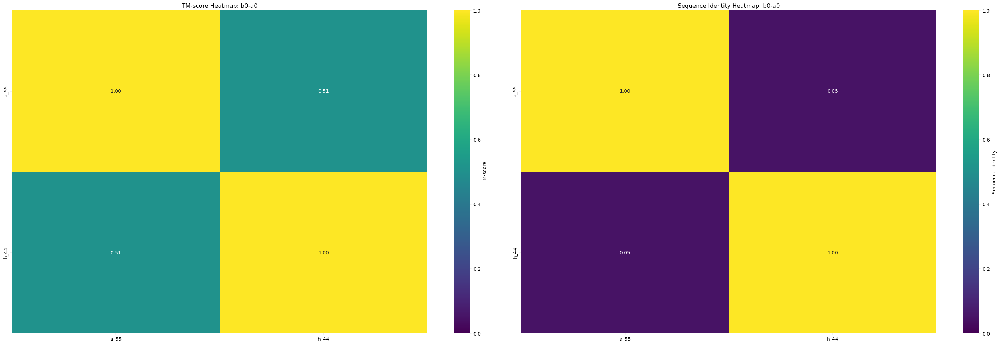


Processing domain: b2


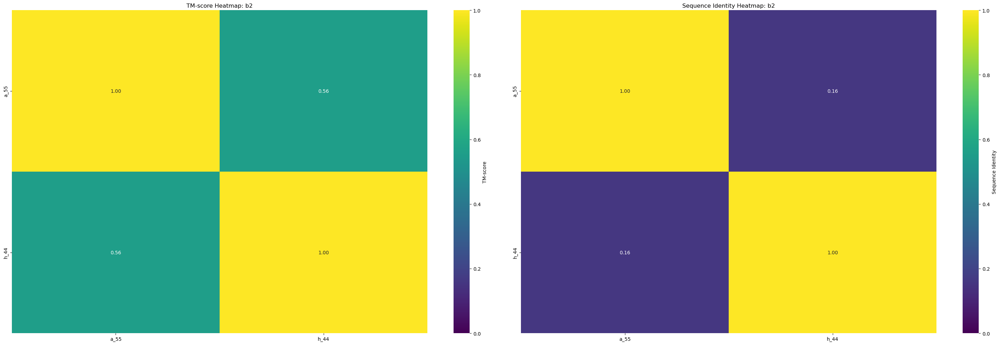


Processing domain: a1


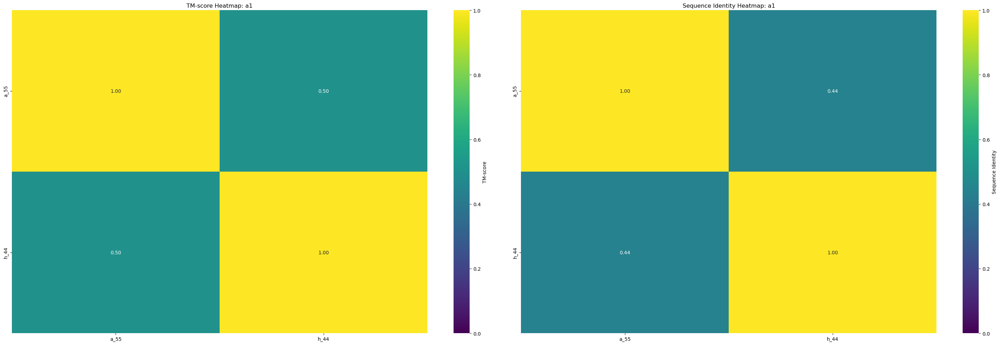


Processing domain: b3-ploop


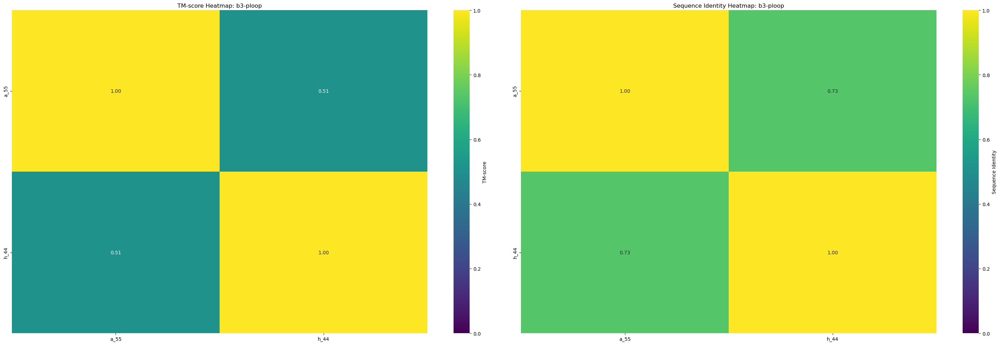


Processing domain: L5-a2


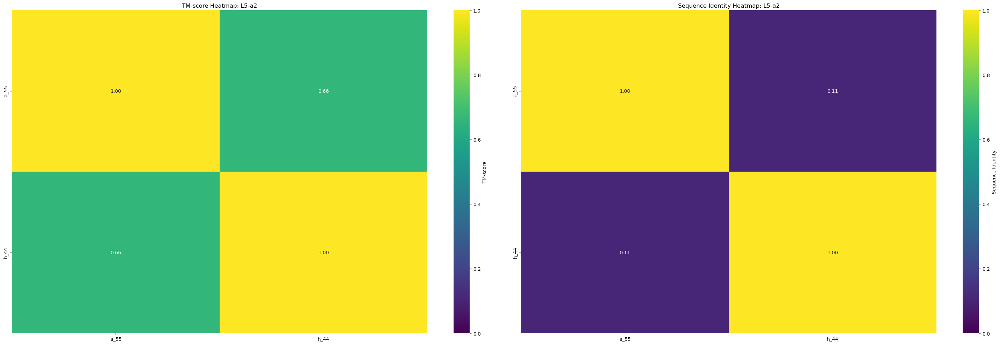


Processing domain: b4-L8-b5


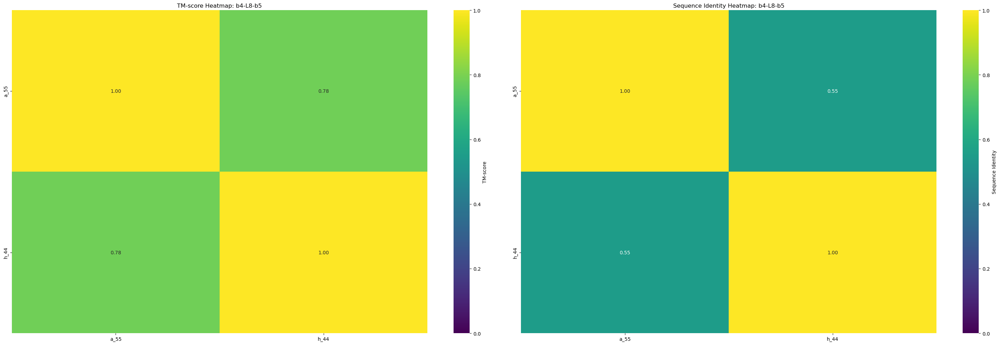


Processing domain: L9-SwI


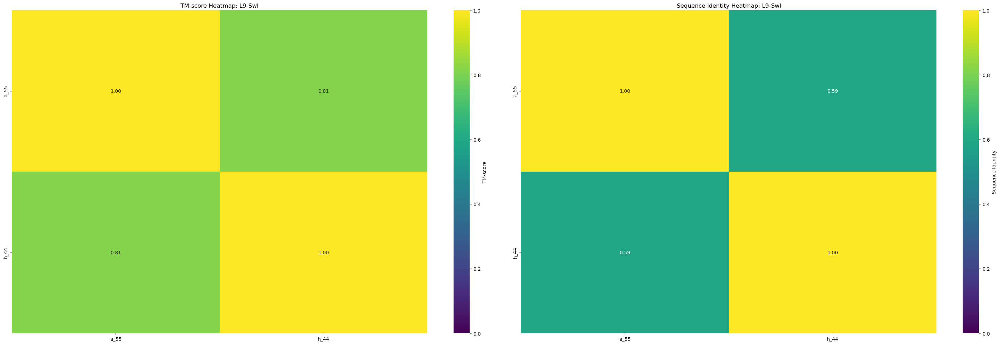


Processing domain: b6-b7


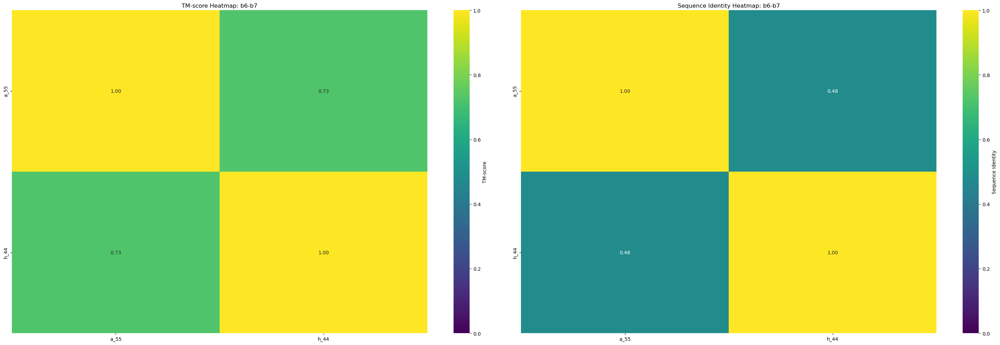


Processing domain: L11-SwII


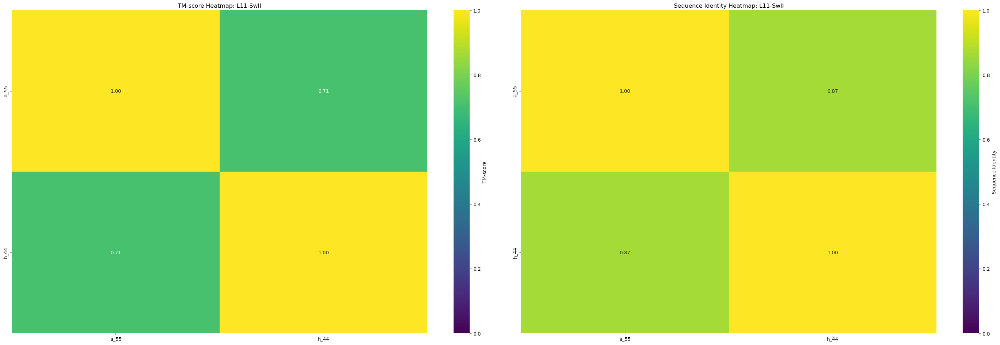


Processing domain: a4


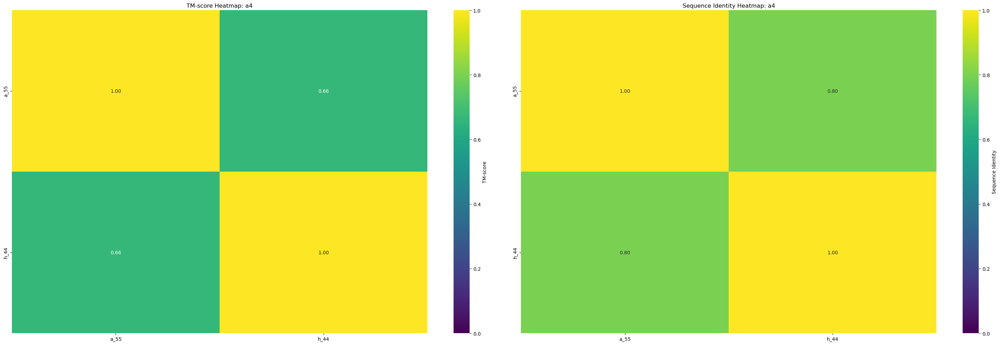


Processing domain: L12-a5


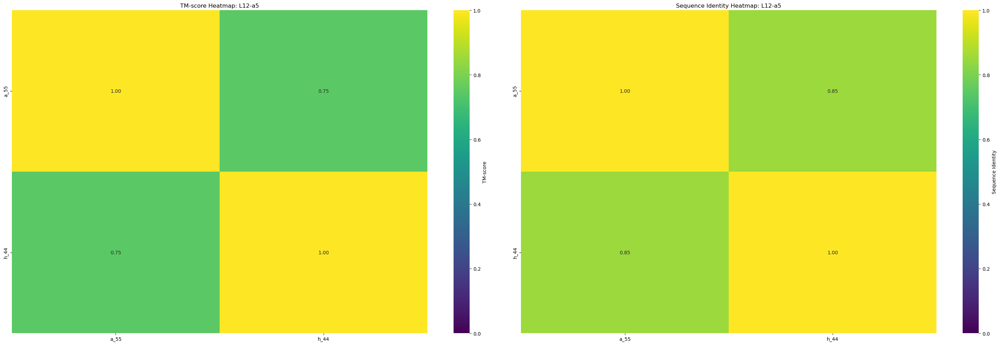


Processing domain: b8-a6


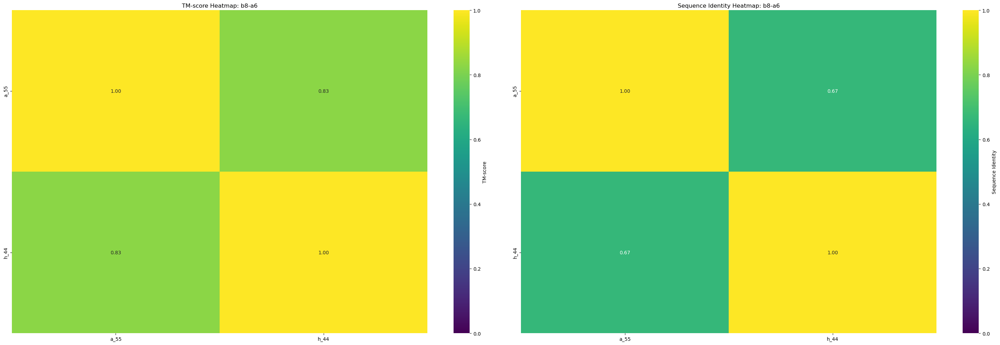


Processing domain: neck


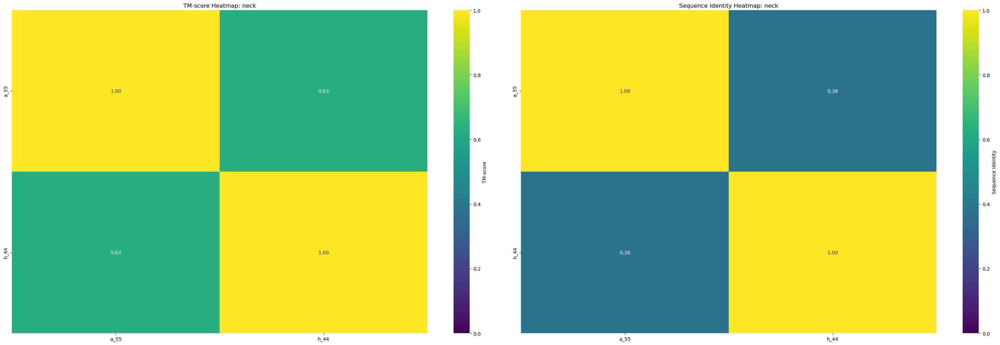


Processing domain: coiled-coil


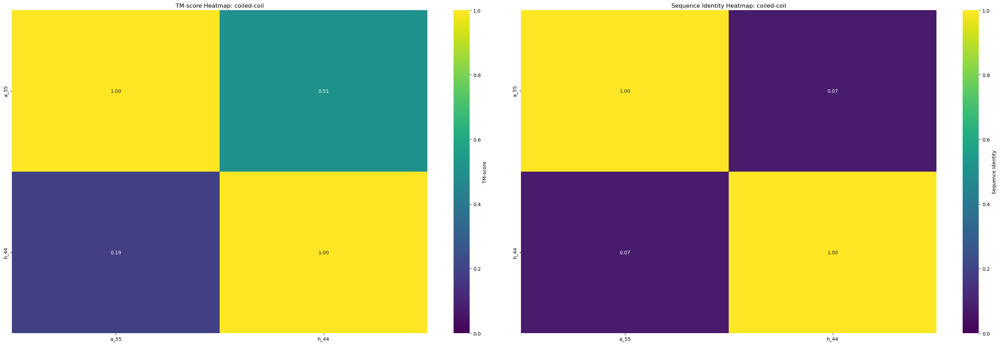

In [2]:
import os
import subprocess
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select

# ------------------- Residue Selector -------------------
class ResidueRangeSelect(Select):
    def __init__(self, start_residue, end_residue):
        self.start_residue = start_residue
        self.end_residue = end_residue
    def accept_residue(self, residue):
        return (
            residue.get_parent().id == "A" and
            self.start_residue <= residue.get_id()[1] <= self.end_residue
        )

def extract_residue_range(input_path, output_path, start_residue, end_residue):
    ext = os.path.splitext(input_path)[1].lower()
    parser = PDBParser(QUIET=True) if ext == ".pdb" else MMCIFParser(QUIET=True)
    structure = parser.get_structure('structure', input_path)
    io = PDBIO()
    io.set_structure(structure)
    io.save(output_path, ResidueRangeSelect(start_residue, end_residue))

# ------------------- USalign Parsing -------------------
def parse_usalign_output(output, name1, name2):
    tm_scores = []
    seq_id = None
    seq1, seq2 = "", ""
    lines = output.splitlines()
    for line in lines:
        if line.startswith("TM-score="):
            try:
                tm_scores.append(float(line.split('=')[1].split()[0]))
            except ValueError:
                continue
        elif "Seq_ID=n_identical/n_aligned=" in line:
            try:
                seq_id = float(line.split("Seq_ID=n_identical/n_aligned=")[1].strip())
            except ValueError:
                continue
    i = 0
    while i < len(lines) - 2:
        top, mid, bot = lines[i].strip(), lines[i+1].strip(), lines[i+2].strip()
        if all(c.isalpha() or c == '-' for c in top) and all(c.isalpha() or c == '-' for c in bot) and set(mid) <= set(": ."):
            seq1 += top
            seq2 += bot
            i += 3
        else:
            i += 1
    df = pd.DataFrame({name1: list(seq1), name2: list(seq2)})
    return tm_scores, seq_id, df

# ------------------- Domain Sequence Match -------------------
def find_gapped_sequence_indices(aligned_sequence, target_sequence):
    clean_sequence = aligned_sequence.replace("-", "")
    start = clean_sequence.find(target_sequence)
    if start == -1:
        return None
    gapped_indices = []
    clean_index = 0
    for i, c in enumerate(aligned_sequence):
        if c != "-":
            if start <= clean_index < start + len(target_sequence):
                gapped_indices.append(i)
            clean_index += 1
        else:
            if start <= clean_index < start + len(target_sequence):
                gapped_indices.append(i)
    return min(gapped_indices), max(gapped_indices)

# ------------------- Aligner -------------------
def align_structures(structure1_path, structure2_path, start_residue, end_residue, domain):
    base1 = os.path.splitext(os.path.basename(structure1_path))[0]
    base2 = os.path.splitext(os.path.basename(structure2_path))[0]

    domain_dir = os.path.join("../../data/3d_predictions/prodigy/trimmed_segments", domain)
    os.makedirs(domain_dir, exist_ok=True)

    trimmed1 = os.path.join(domain_dir, f"{base1}_{domain}.pdb")
    trimmed2 = os.path.join(domain_dir, f"{base2}_{domain}.pdb")

    extract_residue_range(structure1_path, trimmed1, start_residue, end_residue)
    extract_residue_range(structure2_path, trimmed2, start_residue, end_residue)

    result = subprocess.run(["USalign", trimmed1, trimmed2], stdout=subprocess.PIPE, text=True)
    return parse_usalign_output(result.stdout, base1, base2), base1, base2

# ------------------- Inputs -------------------
structure_paths = [
    "../../data/3d_predictions/prodigy/a_55.pdb",
    "../../data/3d_predictions/prodigy/h_44.pdb",
]

reference_path = structure_paths[0]
reference_name = os.path.splitext(os.path.basename(reference_path))[0]
structure_map = {os.path.splitext(os.path.basename(p))[0]: p for p in structure_paths}
structures = list(structure_map.keys())

domain_sequences = {
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5-a2": "GVIGDSVKQGIIPRIVNDIFNHIYA",
    "b4-L8-b5": "LEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYV",
    "L9-SwI": "PEDVFEVIEEGKSNRHIAVTNMNEHSSRS",
    "b6-b7": "HSVFLINVKQENLENQKKLSGKLYLVD",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12-a5": "GNKTHIPYRDSKLTRILQES",
    "b8-a6": "RTTIVICCSPASFNESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# ------------------- Build Alignment Matrix -------------------
alignment_matrix = pd.DataFrame()
reference_column = None

for path in structure_paths[1:]:
    (tm_scores, seq_id, df), _, target_name = align_structures(reference_path, path, 1, 9999, "full")
    if reference_column is None:
        reference_column = df[reference_name]
    alignment_matrix[target_name] = df[target_name]

alignment_matrix.insert(0, reference_name, reference_column.reset_index(drop=True))

# ------------------- Infer domain index ranges -------------------
domain_index_ranges = {}
ref_seq = alignment_matrix[reference_name]
ref_string = "".join(ref_seq.tolist())

for domain, domain_seq in domain_sequences.items():
    match = find_gapped_sequence_indices(ref_string, domain_seq)
    if match:
        domain_index_ranges[domain] = match
    else:
        print(f"WARNING: Could not find domain '{domain}' in a_55")

# ------------------- Compute TM and SeqID -------------------
for domain, (start_idx, end_idx) in domain_index_ranges.items():
    print(f"\nProcessing domain: {domain}")
    aln_segment = alignment_matrix.iloc[start_idx:end_idx + 1]

    tm_matrix = pd.DataFrame(index=structures, columns=structures, dtype=float)
    seqid_matrix = pd.DataFrame(index=structures, columns=structures, dtype=float)

    for i, name_i in enumerate(structures):
        for j, name_j in enumerate(structures):
            seq_i = "".join(aln_segment[name_i].tolist()).replace("-", "")
            seq_j = "".join(aln_segment[name_j].tolist()).replace("-", "")
            identity = sum(a == b for a, b in zip(seq_i, seq_j)) / max(len(seq_i), len(seq_j)) if seq_i and seq_j else np.nan
            seqid_matrix.loc[name_i, name_j] = identity

            try:
                (tm_scores, _, _), _, _ = align_structures(
                    structure_map[name_i],
                    structure_map[name_j],
                    start_idx + 1,
                    end_idx + 1,
                    domain
                )
                tm_matrix.loc[name_i, name_j] = tm_scores[0]
            except:
                tm_matrix.loc[name_i, name_j] = np.nan

    plt.figure(figsize=(30, 10))
    plt.subplot(1, 2, 1)
    sns.heatmap(tm_matrix, annot=True, fmt=".2f", cmap="viridis", vmin=0, vmax=1, cbar_kws={"label": "TM-score"})
    plt.title(f"TM-score Heatmap: {domain}")
    plt.subplot(1, 2, 2)
    sns.heatmap(seqid_matrix, annot=True, fmt=".2f", cmap="viridis", vmin=0, vmax=1, cbar_kws={"label": "Sequence Identity"})
    plt.title(f"Sequence Identity Heatmap: {domain}")
    plt.tight_layout()
    plt.show()

In [65]:
from Bio import AlignIO
import pandas as pd

# === Load the alignment ===
alignment = AlignIO.read("../../../../Downloads/clustalo-I20250514-094620-0072-69923726-p1m.aln-clustal_num", "clustal")

# === Convert to DataFrame ===
alignment_dict = {record.id: list(str(record.seq)) for record in alignment}
df = pd.DataFrame(alignment_dict)

# === Reference sequence name ===
ref_name = "a_55"  # Replace with the actual ID if different
if ref_name not in df.columns:
    raise ValueError(f"{ref_name} not found in alignment.")

# === Get gapped reference sequence ===
ref_seq_gapped = df[ref_name].tolist()
ref_seq_ungapped = [res for res in ref_seq_gapped if res != '-']

# === Map: ungapped index → gapped index ===
ungapped_to_gapped = [i for i, res in enumerate(ref_seq_gapped) if res != '-']
gapped_seq_str = ''.join(ref_seq_ungapped)

# === Domain dictionary ===
domain_sequences = {
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5-a2": "GVIGDSVKQGIIPRIVNDIFNHIYA",
    "b4-L8-b5": "LEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYV",
    "a3-L9-SwI": "PEDVFEVIEEGKSNRHIAVTNMNEHSSRS",
    "b6-b7": "HSVFLINVKQENLENQKKLSGKLYLVD",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12-a5": "GNKTHIPYRDSKLTRILQES",
    "b8-a6": "RTTIVICCSPASFNESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# === Initialize domain labels ===
domain_labels = ['-'] * len(ref_seq_gapped)

# === Assign domain labels ===
for label, subseq in domain_sequences.items():
    start_idx = gapped_seq_str.find(subseq)
    if start_idx == -1:
        print(f"[NOT FOUND] {label}")
        continue
    gapped_start = ungapped_to_gapped[start_idx]
    gapped_end = ungapped_to_gapped[start_idx + len(subseq) - 1]
    for i in range(gapped_start, gapped_end + 1):
        domain_labels[i] = label
    print(f"[FOUND] {label}: gapped indices {gapped_start}-{gapped_end}")

# === Assign crude module labels ===
module_labels = (
    ["ATP-binding"] * 252 +
    ["Hydrolysis"] * (409 - 252) +
    ["Stalk"] * (len(ref_seq_gapped) - 409)
)
module_labels = module_labels[:len(ref_seq_gapped)]

# === Combine into final DataFrame ===
df_final = pd.concat([
    pd.DataFrame({
        "Module": module_labels,
        "Domain": domain_labels
    }),
    df.reset_index(drop=True)
], axis=1)

# === Output a slice for inspection ===
df_final.iloc[240:260]

[FOUND] b0-a0: gapped indices 65-85
[FOUND] b2: gapped indices 103-117
[FOUND] a1: gapped indices 123-140
[FOUND] b3-ploop: gapped indices 144-158
[FOUND] L5-a2: gapped indices 162-193
[FOUND] b4-L8-b5: gapped indices 198-243
[FOUND] a3-L9-SwI: gapped indices 254-282
[FOUND] b6-b7: gapped indices 283-309
[FOUND] L11-SwII: gapped indices 309-323
[FOUND] a4: gapped indices 324-348
[FOUND] L12-a5: gapped indices 349-370
[FOUND] b8-a6: gapped indices 376-405
[FOUND] neck: gapped indices 406-418
[FOUND] coiled-coil: gapped indices 419-524


,Module,Domain,thtr_11,a_55,kif5_11,nagr_11,adpa_11,tila_11,acsu2_11,heal_11,dipu_11,h_44
240,ATP-binding,b4-L8-b5,A,V,V,G,G,G,G,G,G,G
241,ATP-binding,b4-L8-b5,I,P,P,V,V,V,V,V,V,V
242,ATP-binding,b4-L8-b5,T,Y,F,Y,Y,W,W,W,W,W
243,ATP-binding,b4-L8-b5,V,V,V,I,I,V,V,V,V,V
244,ATP-binding,-,A,K,K,K,E,D,E,D,D,E
245,ATP-binding,-,G,G,G,G,G,G,G,G,G,G
246,ATP-binding,-,I,A,C,A,V,T,T,T,T,T
247,ATP-binding,-,T,T,T,T,T,T,T,T,T,S
248,ATP-binding,-,E,E,E,E,E,E,E,E,E,E
249,ATP-binding,-,L,R,R,E,K,V,V,V,A,V


In [20]:
from Bio import AlignIO
import pandas as pd

# === Load the alignment ===
alignment = AlignIO.read("../../../../Downloads/all", "clustal")

# === Convert to DataFrame ===
alignment_dict = {record.id: list(str(record.seq)) for record in alignment}
df = pd.DataFrame(alignment_dict)

# === Reference sequence name ===
ref_name = "a_55"  # Replace with actual ID if different
if ref_name not in df.columns:
    raise ValueError(f"{ref_name} not found in alignment.")

# === Get gapped reference sequence and mapping ===
ref_seq_gapped = df[ref_name].tolist()
ref_seq_ungapped = [res for res in ref_seq_gapped if res != '-']
ungapped_to_gapped = [i for i, res in enumerate(ref_seq_gapped) if res != '-']
gapped_seq_str = ''.join(ref_seq_ungapped)

# === Domain definitions from ungapped reference ===
domain_sequences = {
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5": "GVIGDSVKQG",
    "a2": "IIPRIVNDIFNHIYA",
    "b4": "LEFHIKVSYYEIY",
    "L8-b5": "KIRDLLDVSKVNLSVHEDKNRVPYV",
    "a3": "PEDVFEVIEEGKSNR",
    "L9-SwI": "HIAVTNMNEHSSRS",
    "b6": "HSVFLINVKQEN",
    "b7": "QKKLSGKLYLV",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12": "GNKTHIPYRDS",
    "a5": "KLTRILQES",
    "b8-a6": "RTTIVICC",
    "a6": "ESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}



# === Locate gapped index ranges for each domain ===
domain_labels = ['-'] * len(ref_seq_gapped)
domain_ranges = {}

for label, subseq in domain_sequences.items():
    start_idx = gapped_seq_str.find(subseq)
    if start_idx == -1:
        print(f"[NOT FOUND] {label}")
        continue
    gapped_start = ungapped_to_gapped[start_idx]
    gapped_end = ungapped_to_gapped[start_idx + len(subseq) - 1]
    domain_ranges[label] = (gapped_start, gapped_end)
    for i in range(gapped_start, gapped_end + 1):
        domain_labels[i] = label
    print(f"[FOUND] {label}: gapped indices {gapped_start}-{gapped_end}")

# === Assign module labels ===
module_boundaries = {
    "1/3": 252,
    "2/3": 409
}

module_labels = []
for module, boundary in module_boundaries.items():
    module_labels.extend([module] * (boundary - len(module_labels)))

module_labels.extend(["3/3"] * (len(ref_seq_gapped) - len(module_labels)))
module_labels = module_labels[:len(ref_seq_gapped)]

# === Final annotated alignment dataframe ===
df_final = pd.concat([
    pd.DataFrame({
        "Module": module_labels,
        "Subdomain": domain_labels
    }),
    df.reset_index(drop=True)
], axis=1)

# === Construct per-protein domain sequence dictionaries ===
domain_sequences = {}

for protein in df.columns:
    domain_dict = {}
    for domain, (start, end) in domain_ranges.items():
        segment = df.loc[start:end, protein].tolist()
        sequence = ''.join(segment).replace('-', '')
        domain_dict[domain] = sequence
    domain_sequences[protein] = domain_dict

# === Inspect one example ===
domain_sequences

[FOUND] b0-a0: gapped indices 65-85
[FOUND] b2: gapped indices 103-117
[FOUND] a1: gapped indices 123-140
[FOUND] b3-ploop: gapped indices 144-158
[FOUND] L5: gapped indices 162-178
[FOUND] a2: gapped indices 179-193
[FOUND] b4: gapped indices 198-210
[FOUND] L8-b5: gapped indices 213-243
[FOUND] a3: gapped indices 254-268
[FOUND] L9-SwI: gapped indices 269-282
[FOUND] b6: gapped indices 283-294
[FOUND] b7: gapped indices 298-308
[FOUND] L11-SwII: gapped indices 309-323
[FOUND] a4: gapped indices 324-348
[FOUND] L12: gapped indices 349-361
[FOUND] a5: gapped indices 362-370
[FOUND] b8-a6: gapped indices 376-383
[FOUND] a6: gapped indices 390-405
[FOUND] neck: gapped indices 406-418
[FOUND] coiled-coil: gapped indices 419-498


{'thtr_11': {'b0-a0': 'DKMSVRVAVRVRPLLPKENTV',
  'b2': 'LVLGGQRSFTYDYVF',
  'a1': 'QAALYTDAVSPLIDAFFD',
  'b3-ploop': 'ATVLAYGQTGSGKTY',
  'L5': 'SGSNASLAAAQLG',
  'a2': 'VIPRVIRAMYTRIAE',
  'b4': 'SAYSMRVSFLEIH',
  'L8-b5': 'NIVDLFNPAVSTKTNSLAIREADGAITV',
  'a3': 'ADDLLDKLERGSISR',
  'L9-SwI': 'TTASTLMNSESSRS',
  'b6': 'HAIFSLILEQSP',
  'b7': 'AGRLVSKFHFV',
  'L11-SwII': 'DLAGSERLKRTKAVG',
  'a4': 'DRLKEGININCGLLALGNVISALGD',
  'L12': 'PKRKARHIPYRDS',
  'a5': 'KLTRLLQDS',
  'b8-a6': 'RTLMIACV',
  'a6': 'FEETLNTLRYADRARK',
  'neck': 'IKNKPIVNLDLNS',
  'coiled-coil': 'AQLSSLKAHIKQLQLELAAARTSGGDALPPAPALPSDNVLKLQMENEVL'},
 'kif5_11': {'b0-a0': 'NECSIKVLCRFRPLNQAEILR',
  'b2': 'SVVIGGKPYVFDRVF',
  'a1': 'QEQVYHACAMQIVKDVLA',
  'b3-ploop': 'GTIFAYGQTSSGKTH',
  'L5': 'GKLHDPQLMG',
  'a2': 'IIPRIARDIFNHIYS',
  'b4': 'LEFHIKVSYFEIY',
  'L8-b5': 'KIRDLLDVTKTNLSVHEDKNRVPFV',
  'a3': 'PEEILDVIDEGKSNR',
  'L9-SwI': 'HVAVTNMNEHSSRS',
  'b6': 'HSIFLINIKQEN',
  'b7': 'EQKLSGKLYLV',
  'L11-SwII': 'DLA

In [23]:
df_final.to_csv('../../../../Downloads/df_final.csv', index=True)

/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warning


=== Processing domain: b0-a0 ===


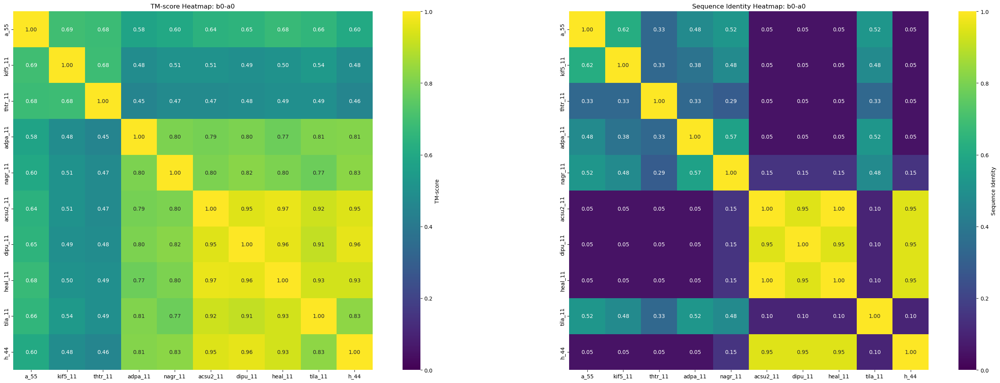


=== Processing domain: b2 ===


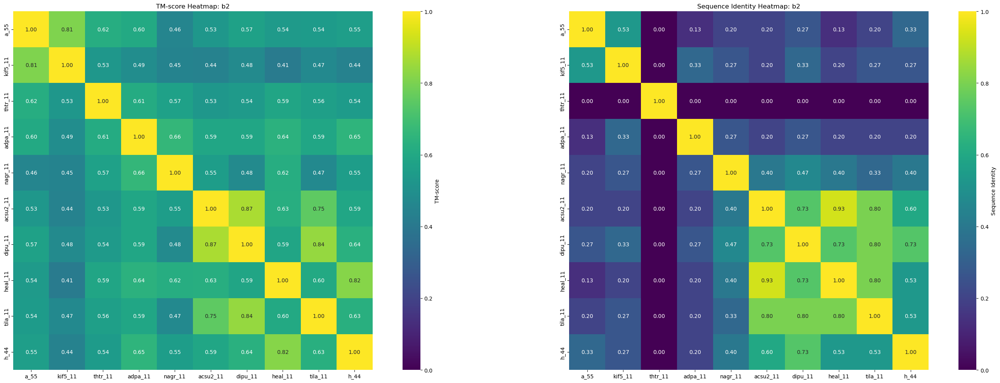


=== Processing domain: a1 ===


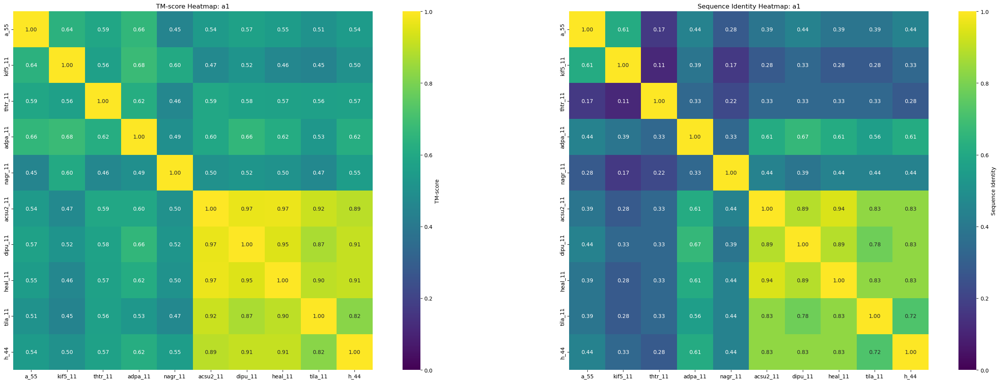


=== Processing domain: b3-ploop ===


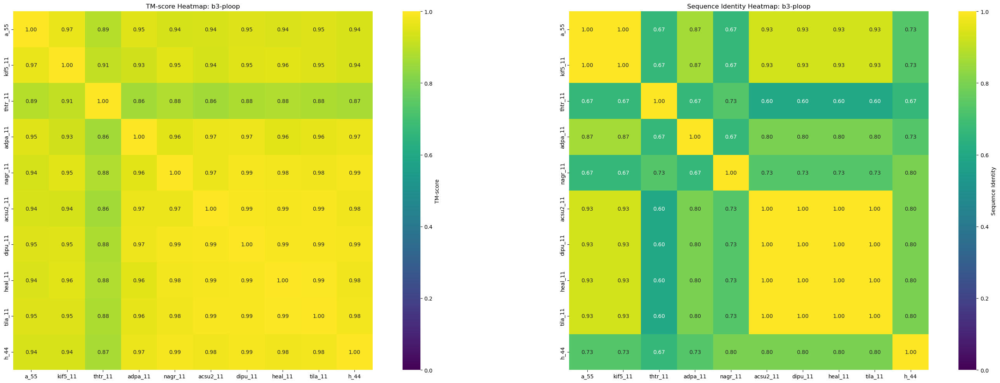


=== Processing domain: L5-a2 ===


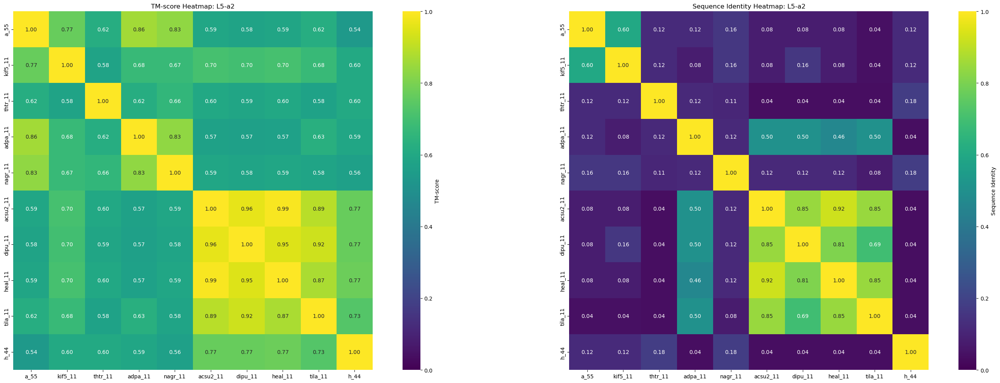


=== Processing domain: b4-L8-b5 ===


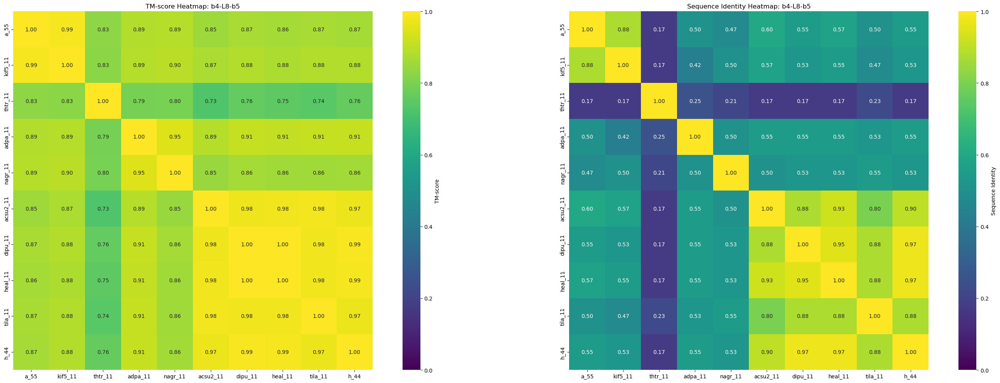


=== Processing domain: a3-L9-SwI ===


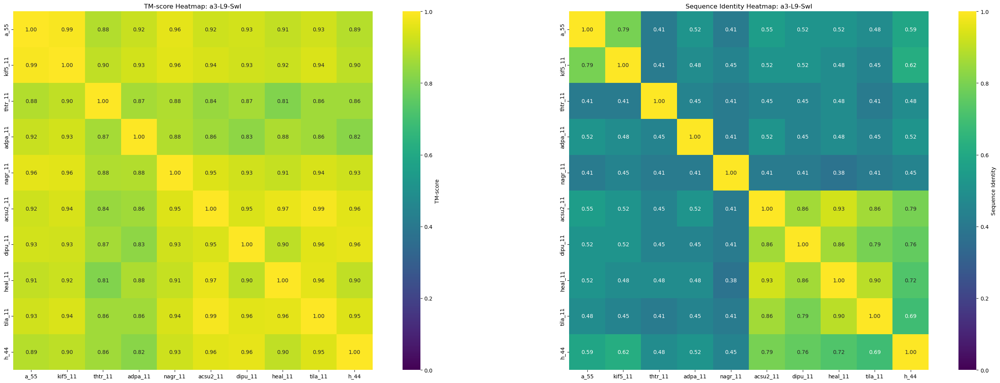


=== Processing domain: b6-b7 ===


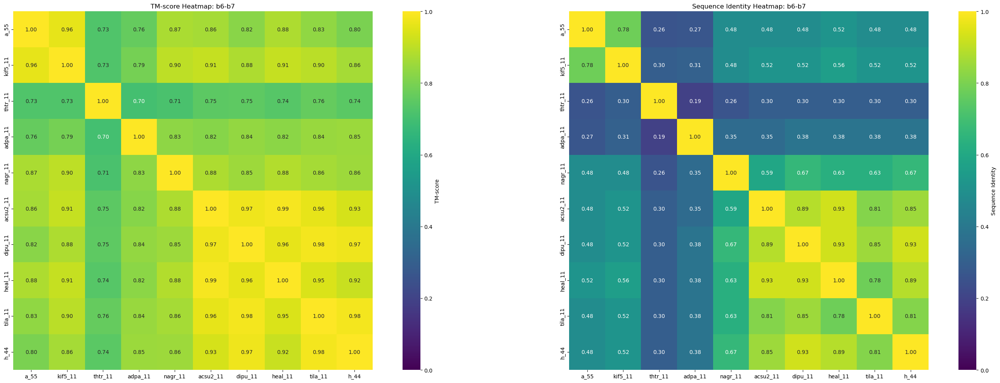


=== Processing domain: L11-SwII ===


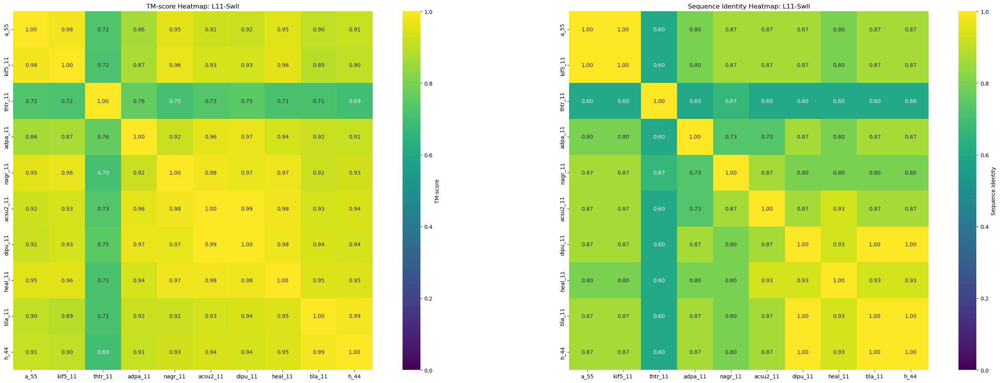


=== Processing domain: a4 ===


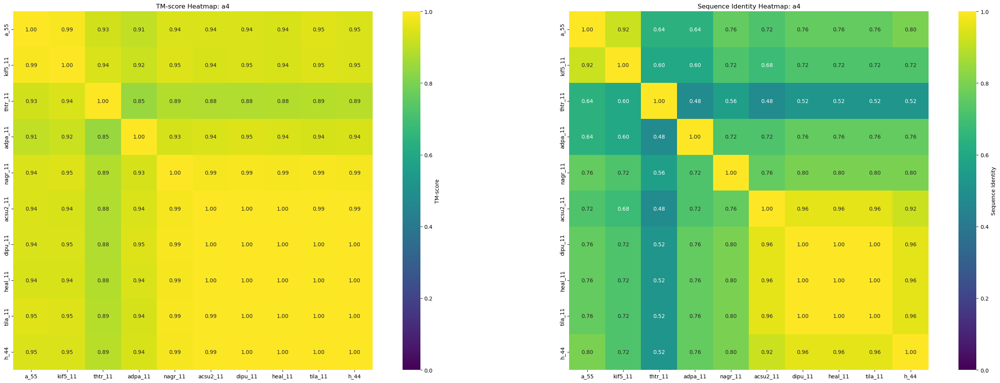


=== Processing domain: L12-a5 ===


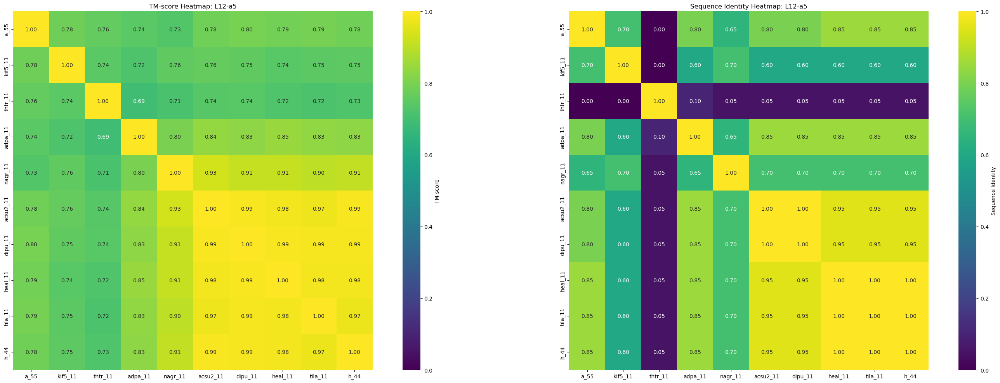


=== Processing domain: b8-a6 ===


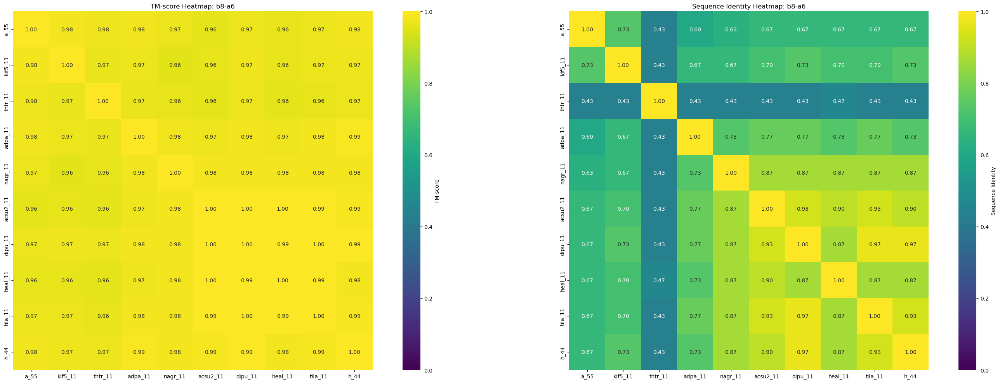


=== Processing domain: neck ===


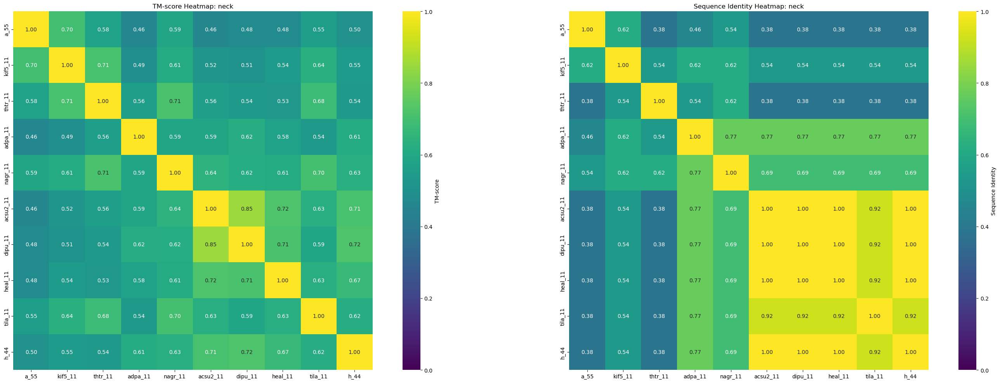


=== Processing domain: coiled-coil ===


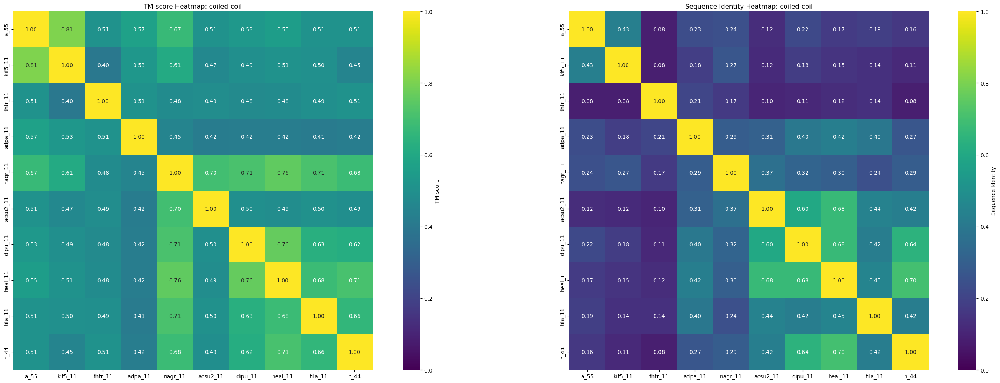


Done. Trimmed PDBs saved under '../../data/3d_predictions/prodigy/trimmed_segments/<domain>/'


In [91]:
#!/usr/bin/env python3
"""
Domain‑wise TM‑score & sequence‑identity pipeline (alignment‑free)
=================================================================

* Each domain is located by **exact sequence match** in chain A (no global
  alignment step).
* Matching residues are trimmed into per‑domain PDBs.
* USalign is run on every pair of trimmed PDBs to obtain TM‑scores.
* Two heat‑maps (TM‑score, sequence identity) are drawn for every domain.

REQUIREMENTS
------------
Biopython, NumPy, Pandas, Matplotlib, Seaborn, and USalign in your PATH.

USAGE
-----
Simply run:  python domain_tmseq_pipeline.py
(The script assumes the relative data paths shown below. Adjust if needed.)
"""
import os
import subprocess
import functools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select, Polypeptide

# ----------------------------------------------------------------------
#  ----------  helpers for trimming PDBs -------------------------------
# ----------------------------------------------------------------------
class ResidueListSelect(Select):
    """Keep residues whose (hetflag, resseq, icode) id is in `keep_set`."""
    def __init__(self, keep_set):
        self.keep_set = keep_set
    def accept_residue(self, residue):
        return residue.get_parent().id == "A" and residue.get_id() in self.keep_set

def save_trimmed_segment(input_path, output_path, keep_residues):
    """Write chain‑A residues in `keep_residues` to `output_path`."""
    ext     = os.path.splitext(input_path)[1].lower()
    parser  = PDBParser(QUIET=True) if ext == ".pdb" else MMCIFParser(QUIET=True)
    struct  = parser.get_structure("str", input_path)
    io      = PDBIO()
    io.set_structure(struct)
    io.save(output_path, ResidueListSelect(keep_residues))

def chain_a_sequence(pdb_path):
    """
    Returns
    -------
    seq : str
        One‑letter amino‑acid sequence of chain A (standard residues only).
    residue_ids : list[tuple]
        Parallel list with residue `.get_id()` tuples
        (hetflag, resseq, icode) for mapping back to PDB numbering.
    """
    ext     = os.path.splitext(pdb_path)[1].lower()
    parser  = PDBParser(QUIET=True) if ext == ".pdb" else MMCIFParser(QUIET=True)
    struct  = parser.get_structure("str", pdb_path)
    chain   = struct[0]["A"]                   # assumes chain A exists
    seq, ids = [], []
    for res in chain:
        if not Polypeptide.is_aa(res, standard=True):
            continue
        seq.append(Polypeptide.three_to_one(res.get_resname()))
        ids.append(res.get_id())
    return "".join(seq), ids

# ----------------------------------------------------------------------
#  ----------  USalign wrapper (memoised) ------------------------------
# ----------------------------------------------------------------------
@functools.lru_cache(maxsize=None)
def run_usalign(pdb1, pdb2):
    """
    Run USalign once per pair (cached).

    Returns
    -------
    float
        First TM‑score printed by USalign (normalised to length of structure A).
        Returns np.nan if parsing fails.
    """
    output = subprocess.run(
        ["USalign", pdb1, pdb2],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True,
        check=False,
    ).stdout
    for line in output.splitlines():
        if line.startswith("TM-score="):
            try:
                return float(line.split("=")[1].split()[0])
            except ValueError:
                break
    return np.nan

# ----------------------------------------------------------------------
#  ----------  USER CONFIGURATION --------------------------------------
# ----------------------------------------------------------------------
structure_paths = [
    "../../data/3d_predictions/prodigy/a_55.pdb",
    "../../data/3d_predictions/prodigy/kif5_11.cif",
    "../../data/3d_predictions/prodigy/thtr_11.cif",
    "../../data/3d_predictions/prodigy/adpa_11.cif",
    "../../data/3d_predictions/prodigy/nagr_11.cif",
    "../../data/3d_predictions/prodigy/acsu2_11.cif",
    "../../data/3d_predictions/prodigy/dipu_11.cif",
    "../../data/3d_predictions/prodigy/heal_11.cif",
    "../../data/3d_predictions/prodigy/tila_11.cif",
    "../../data/3d_predictions/prodigy/h_44.pdb",
]

# domain_sequences = {
#     # ------------------------------------------------------------------
#     #  a_55  ------------------------------------------------------------
#     # ------------------------------------------------------------------
#     "a_55": {
#         "b0-a0":       "AEDSIKVVCRFRPLNDSEEKA",
#         "b2":          "CISIAGKVYLFDKVF",
#         "a1":          "QEKVYNEAAKSIVTDVLA",
#         "b3-ploop":    "GTIFAYGQTSSGKTH",
#         "L5-a2":       "GVIGDSVKQGIIPRIVNDIFNHIYA",
#         "b4-L8-b5":    "LEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYV",
#         "a3-L9-SwI":   "PEDVFEVIEEGKSNRHIAVTNMNEHSSRS",
#         "b6-b7":       "HSVFLINVKQENLENQKKLSGKLYLVD",
#         "L11-SwII":    "DLAGSEKVSKTGAEG",
#         "a4":          "TVLDEAKNINKSLSALGNVISALAD",
#         "L12-a5":      "GNKTHIPYRDSKLTRILQES",
#         "b8-a6":       "RTTIVICCSPASFNESETKSTLDFGRRAKT",
#         "neck":        "VKNVVCVNEELTA",
#         "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL",
#     },
#     # ------------------------------------------------------------------
#     #  h_44  ------------------------------------------------------------
#     # ------------------------------------------------------------------
#     "h_44": {
#         "b0-a0":       "MSSIRVVCRFRPQNKLELAQ",
#         "b2":          "NGSESNHSFSFDYVF",
#         "a1":          "QRDVYDHAAKPVIEDIMA",
#         "b3-ploop":    "GTLFVYGQTGSGKTF",
#         "L5-a2":       "GINDPNGDQELRGIVPRMIETVFEFISN",
#         "b4-L8-b5":    "IEFIVKASYIEIYMERIRDLLDTRKDNLKVREEKGKGVWV",
#         "a3-L9-SwI":   "EEDILDVINTGISNRAIAETRMNAESSRS",
#         "b6-b7":       "HSIFILTIQQKNLKVGSIKTGKLYLVD",
#         "L11-SwII":    "DLAGSEKISKTGAQG",
#         "a4":          "TTLDEAKMINKSLSSLGNVINALTD",
#         "L12-a5":      "GKSTHIPYRDSKLTRVLQES",
#         "b8-a6":       "RTTLIINCSPSSYNEAETISTLRFGSRAKN",
#         "neck":        "IKNKAKINQERSA",
#         "coiled-coil": "AELKILLSKAENEIENLKGYIKELETVSGVTVSNLKSSGSGSGSGSGSSSSSSGSSGGSGSGGSSNLSNSVNSTSNLNTSSNTSSSNVNANANVITTSVSAPTS",
#     },
# }
# ----------------------------------------------------------------------

# ---- build helpers ---------------------------------------------------
structure_map   = {os.path.splitext(os.path.basename(p))[0]: p for p in structure_paths}
structures      = list(structure_map.keys())
reference_name  = structures[0]                      # first structure as reference
domain_list     = list(domain_sequences[reference_name].keys())

# ---- cache sequences -------------------------------------------------
seq_cache = {name: chain_a_sequence(path) for name, path in structure_map.items()}

# ----------------------------------------------------------------------
#  ----------  MAIN PROCESSING LOOP ------------------------------------
# ----------------------------------------------------------------------
for domain in domain_list:
    print(f"\n=== Processing domain: {domain} ===")

    # ------------------------------------------------------------------
    #  Trim domain in every structure
    # ------------------------------------------------------------------
    trimmed_paths = {}
    for name in structures:
        if domain not in domain_sequences[name]:
            raise KeyError(
                f"Domain '{domain}' missing for structure '{name}' "
                f"in domain_sequences dictionary."
            )

        pdb_path     = structure_map[name]
        dom_seq      = domain_sequences[name][domain]

        seq, res_ids = seq_cache[name]
        start        = seq.find(dom_seq)
        if start == -1:
            raise ValueError(
                f"Exact domain sequence not found in chain A of {name} "
                f"({pdb_path}) for domain '{domain}'."
            )
        end          = start + len(dom_seq) - 1
        keep_ids     = set(res_ids[start : end + 1])

        out_dir   = os.path.join(
            "../../data/3d_predictions/prodigy/trimmed_segments", domain
        )
        os.makedirs(out_dir, exist_ok=True)
        out_pdb   = os.path.join(out_dir, f"{name}_{domain}.pdb")
        save_trimmed_segment(pdb_path, out_pdb, keep_ids)
        trimmed_paths[name] = out_pdb

    # ------------------------------------------------------------------
    #  Compute TM‑score & sequence identity matrices
    # ------------------------------------------------------------------
    tm_matrix    = pd.DataFrame(index=structures, columns=structures, dtype=float)
    seqid_matrix = pd.DataFrame(index=structures, columns=structures, dtype=float)

    for i, name_i in enumerate(structures):
        seq_i = domain_sequences[name_i][domain]
        for j, name_j in enumerate(structures):
            if j < i:                                # symmetry shortcut
                tm_matrix.iloc[i, j]    = tm_matrix.iloc[j, i]
                seqid_matrix.iloc[i, j] = seqid_matrix.iloc[j, i]
                continue

            seq_j = domain_sequences[name_j][domain]
            ident = sum(a == b for a, b in zip(seq_i, seq_j)) / min(len(seq_i), len(seq_j))
            seqid_matrix.loc[name_i, name_j] = ident

            tm_val = run_usalign(trimmed_paths[name_i], trimmed_paths[name_j])
            tm_matrix.loc[name_i, name_j] = tm_val

    # ------------------------------------------------------------------
    #  Plot heat‑maps
    # ------------------------------------------------------------------
    plt.figure(figsize=(30, 10))

    plt.subplot(1, 2, 1)
    sns.heatmap(
        tm_matrix,
        annot=True,
        fmt=".2f",
        cmap="viridis",
        vmin=0,
        vmax=1,
        square=True,
        cbar_kws={"label": "TM‑score"},
    )
    plt.title(f"TM‑score Heatmap: {domain}")

    plt.subplot(1, 2, 2)
    sns.heatmap(
        seqid_matrix,
        annot=True,
        fmt=".2f",
        cmap="viridis",
        vmin=0,
        vmax=1,
        square=True,
        cbar_kws={"label": "Sequence Identity"},
    )
    plt.title(f"Sequence Identity Heatmap: {domain}")

    plt.tight_layout()
    plt.show()
    plt.close()

print("\nDone. Trimmed PDBs saved under "
      "'../../data/3d_predictions/prodigy/trimmed_segments/<domain>/'")

· loading alignment …


/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warning


— module 1 —


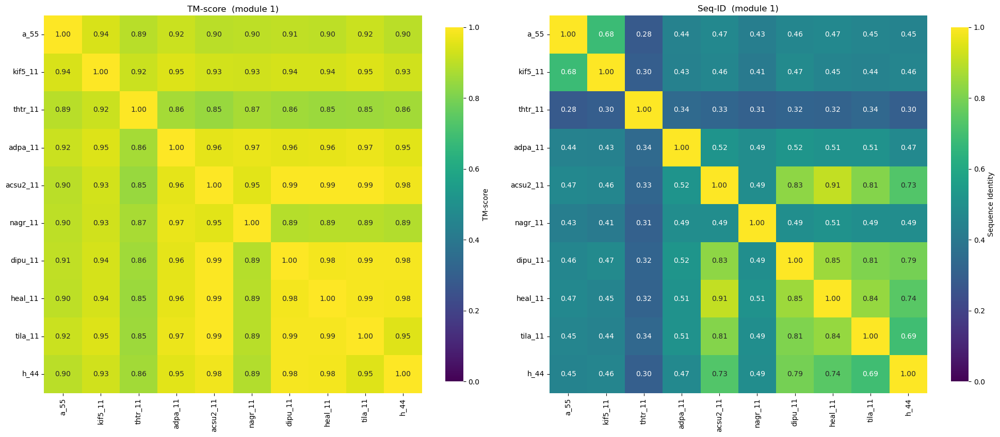


— module 2 —


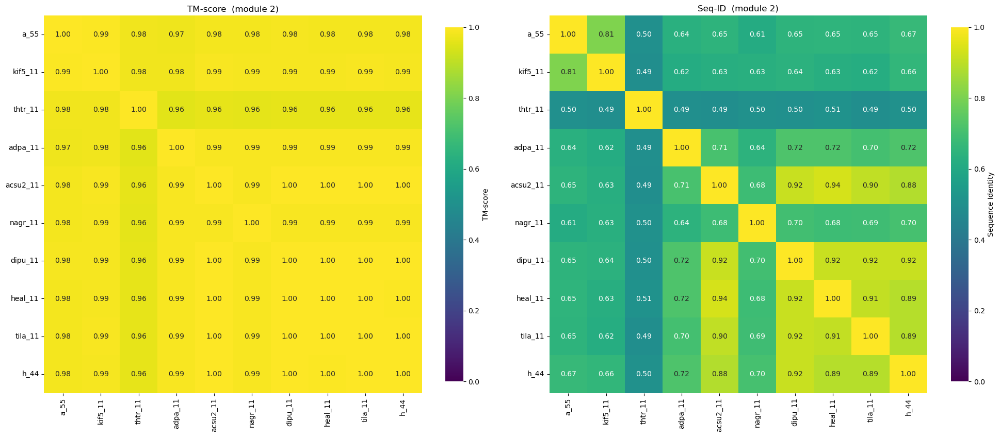


— module 3 —


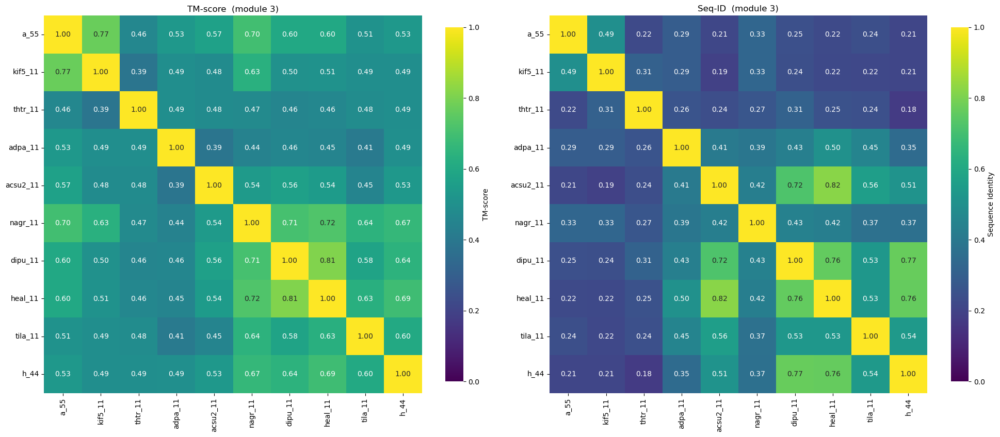


— b0-a0 —


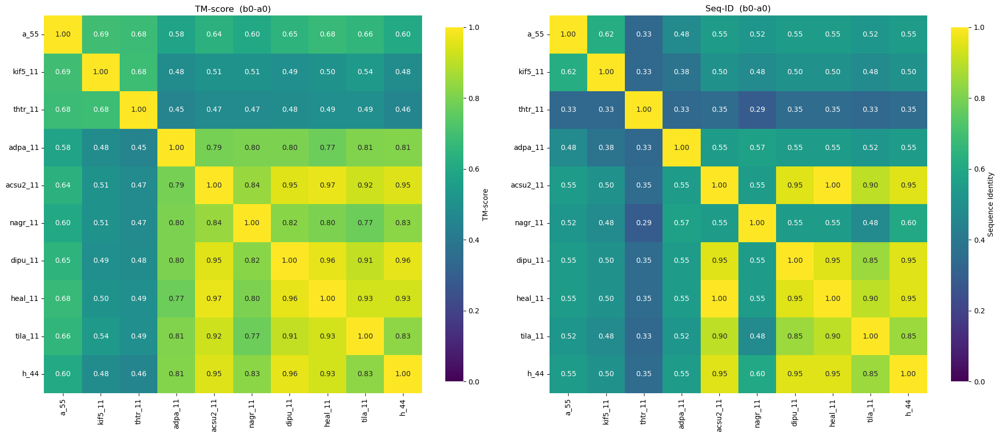


— b2 —


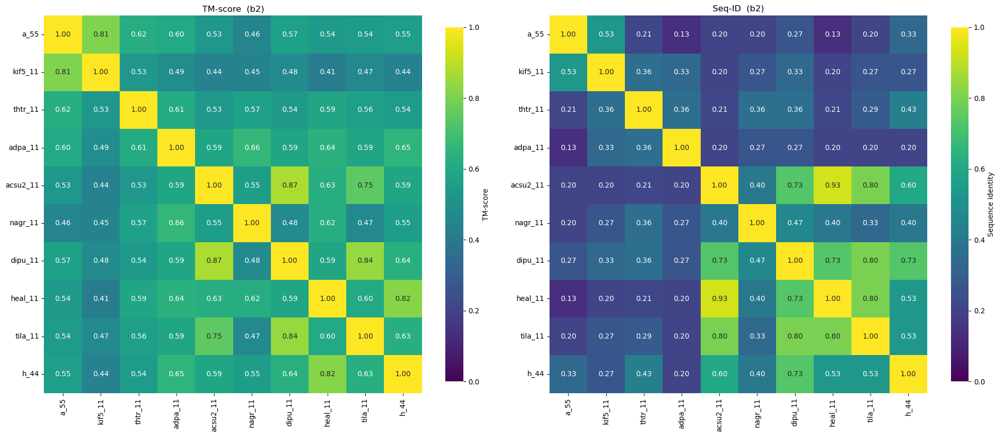


— a1 —


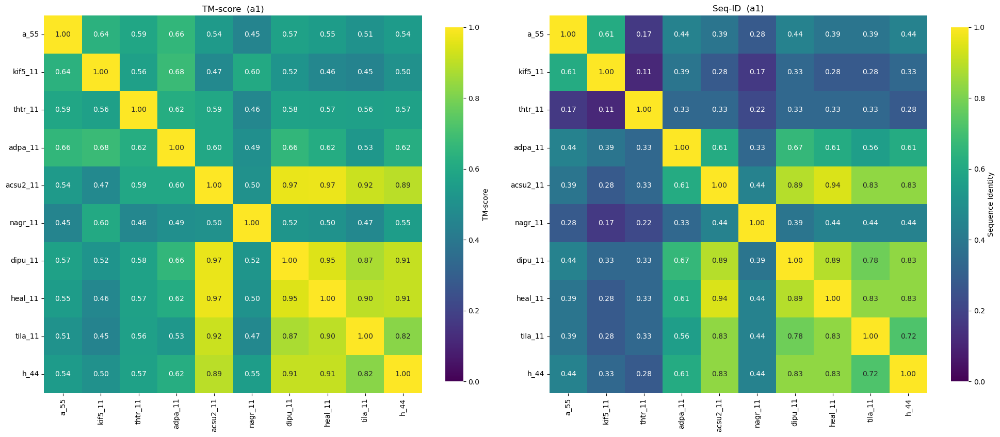


— b3-ploop —


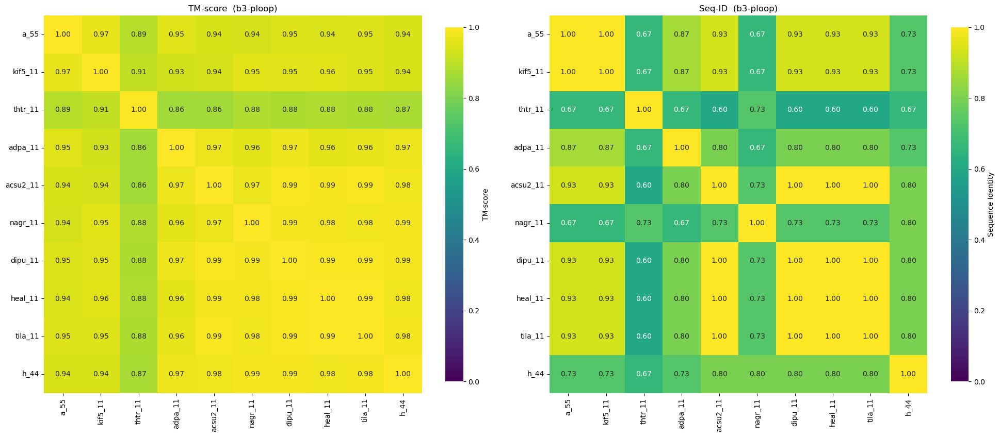


— L5 —


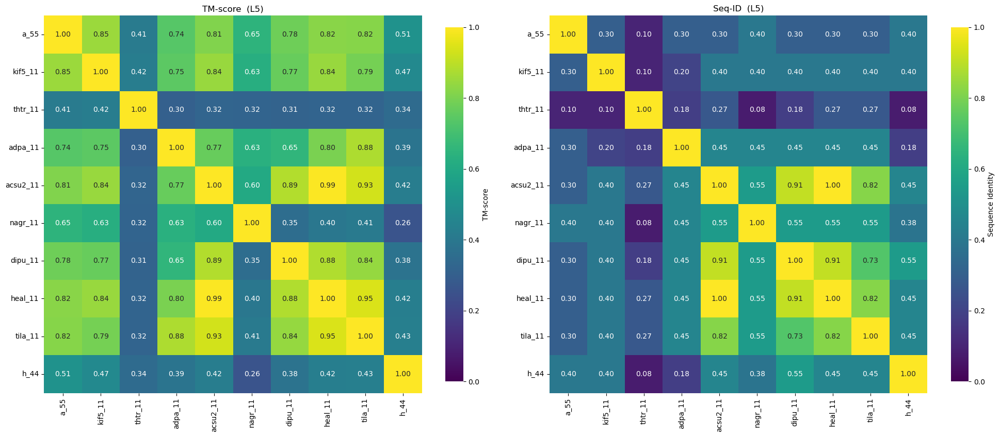


— a2 —


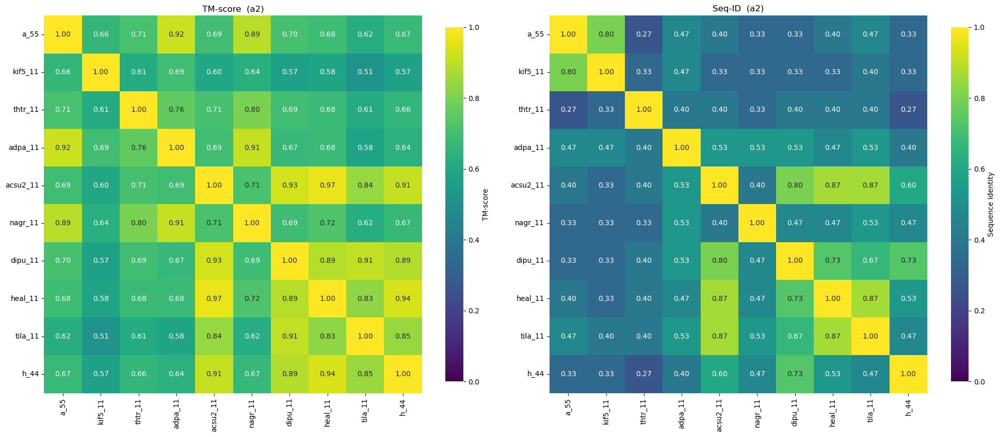


— b4 —


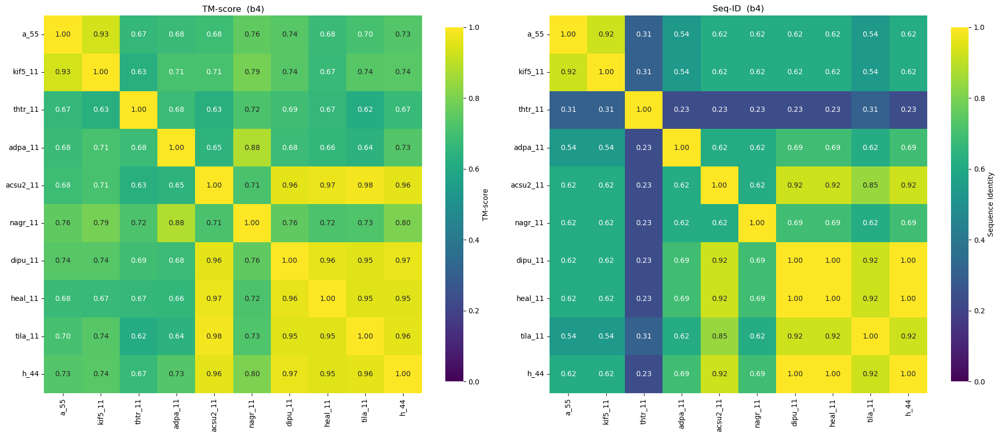


— L8-b5 —


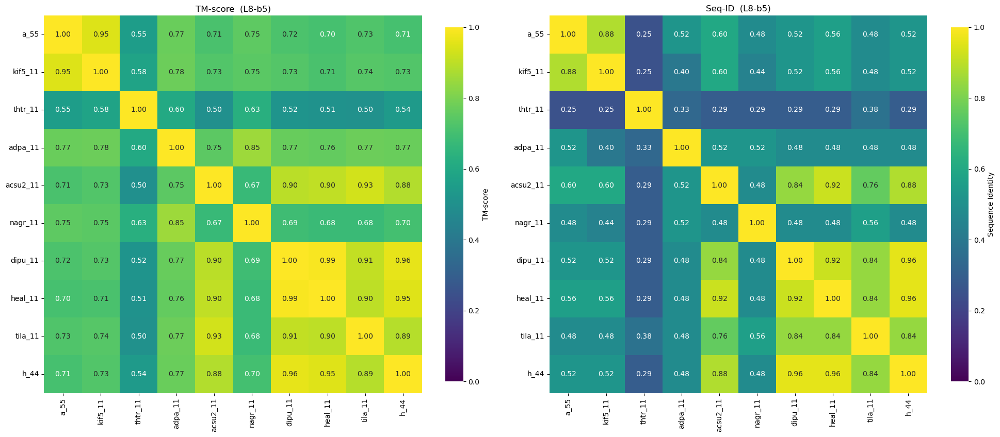


— a3 —


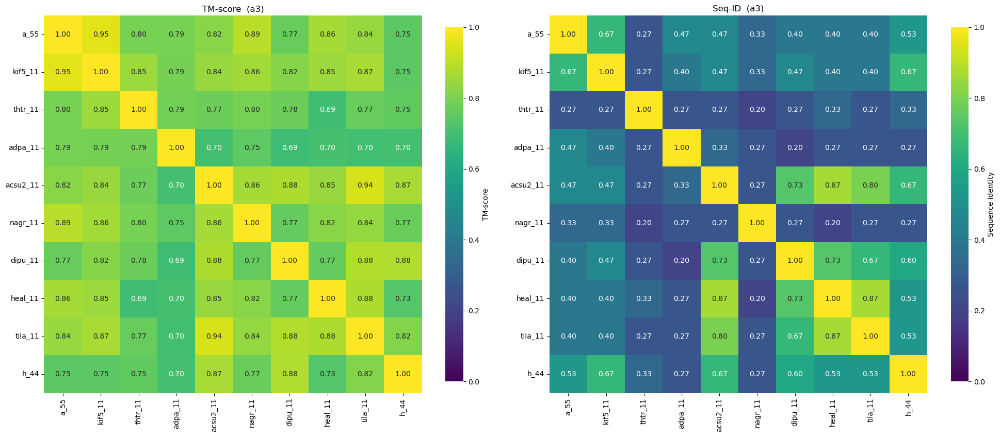


— L9-SwI —


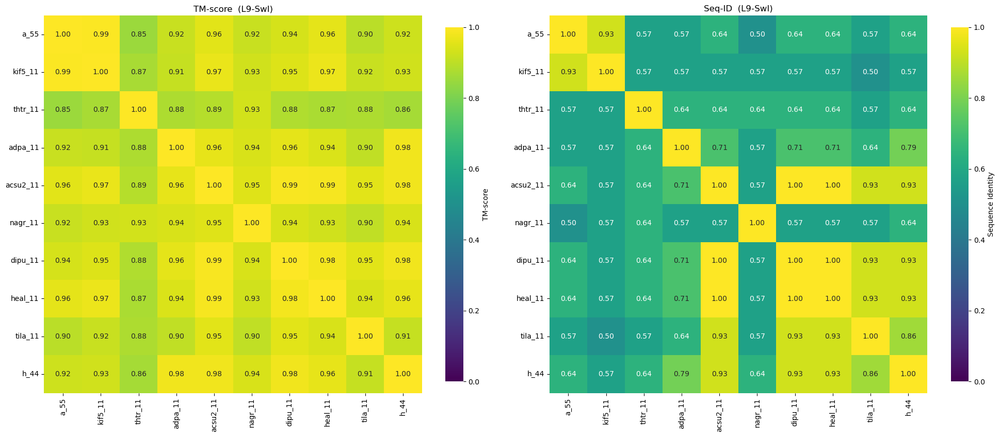


— b6 —


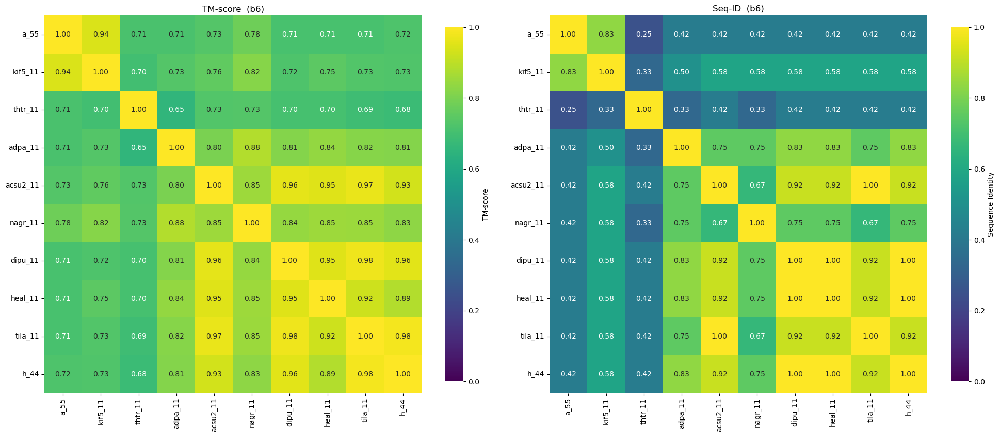


— b7 —


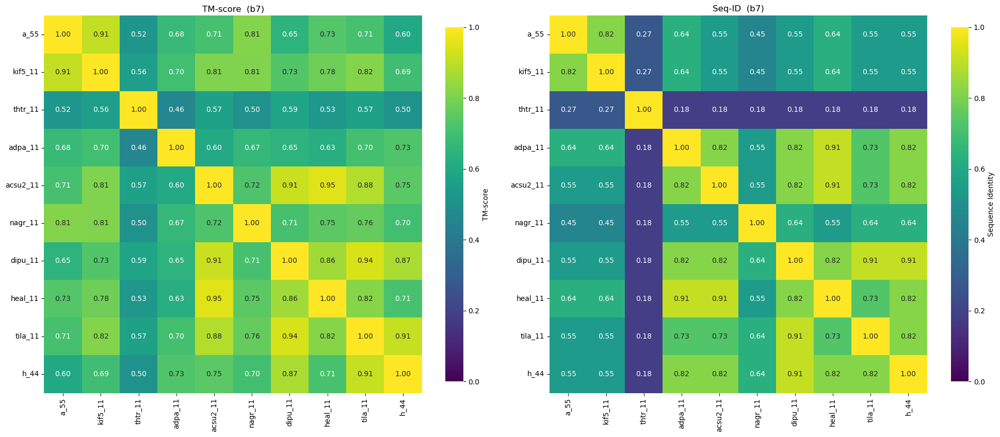


— L11-SwII —


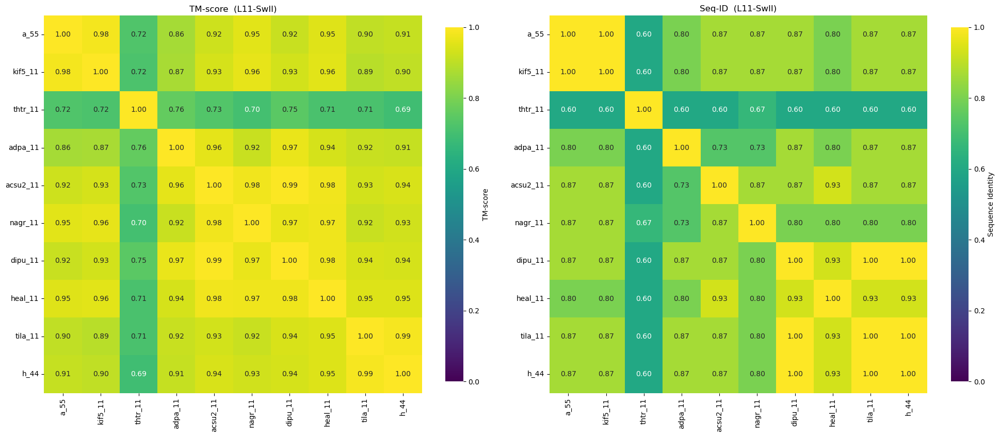


— a4 —


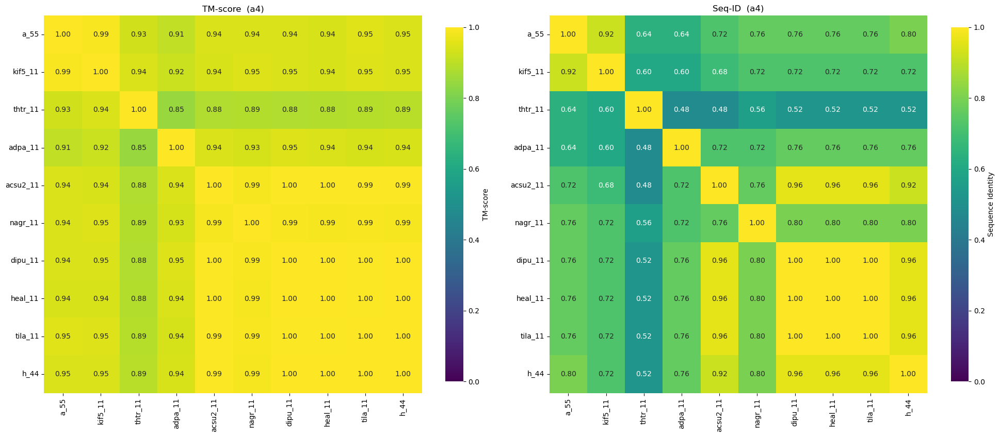


— L12 —


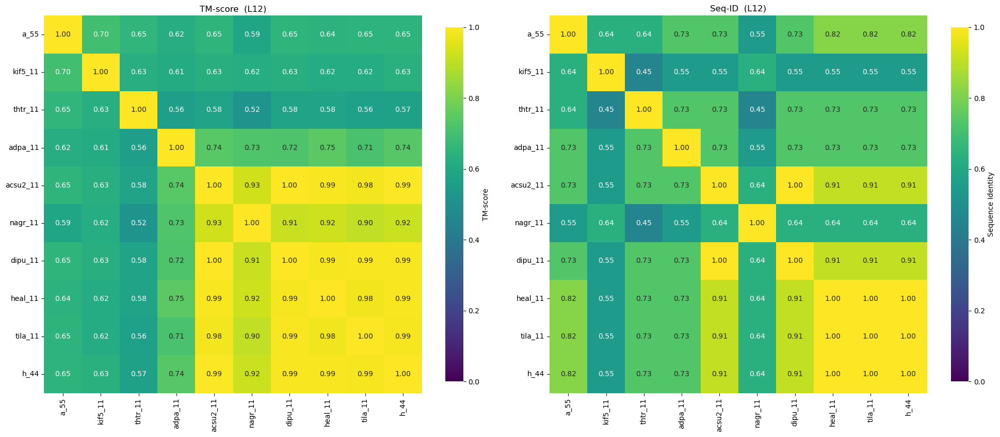


— a5 —


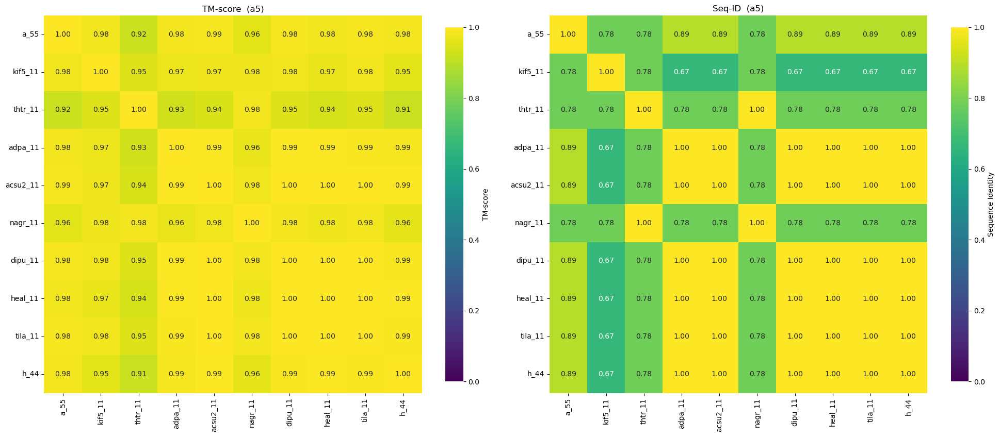


— b8-a6 —


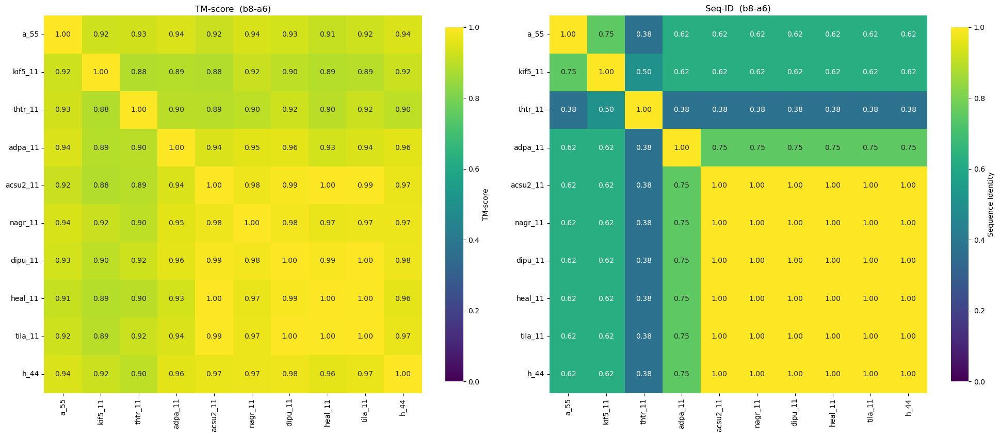


— a6 —


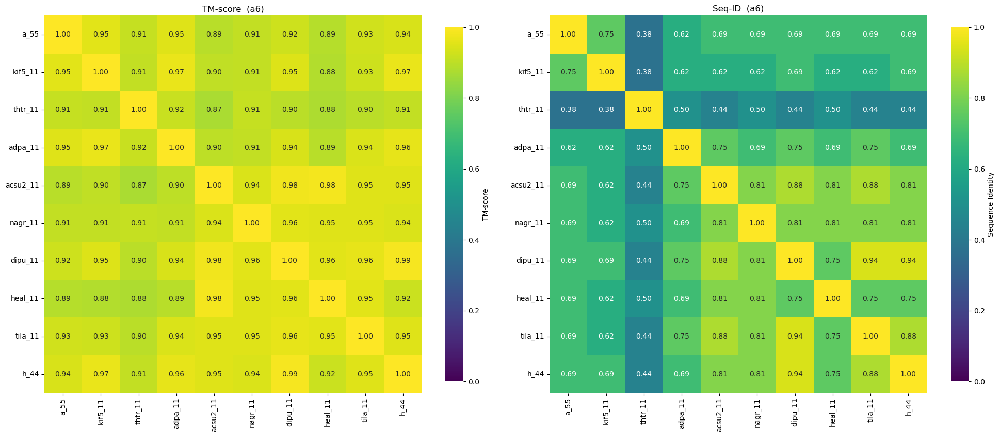


— neck —


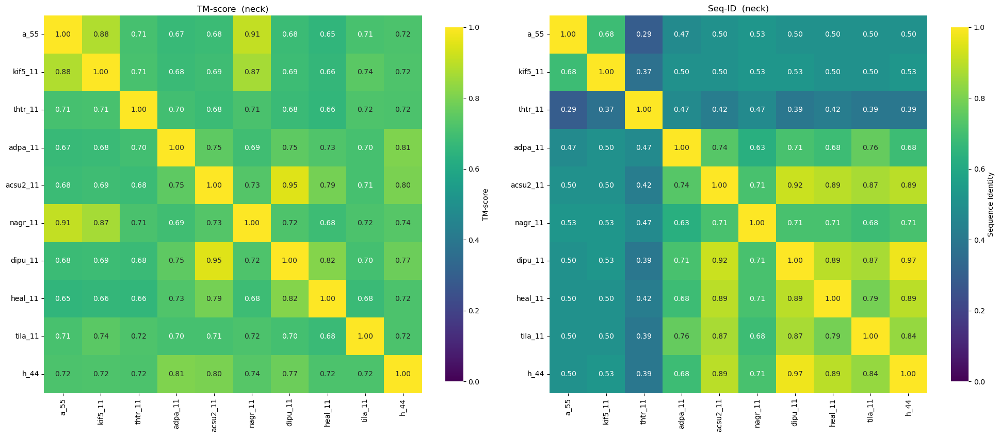


— coiled-coil —


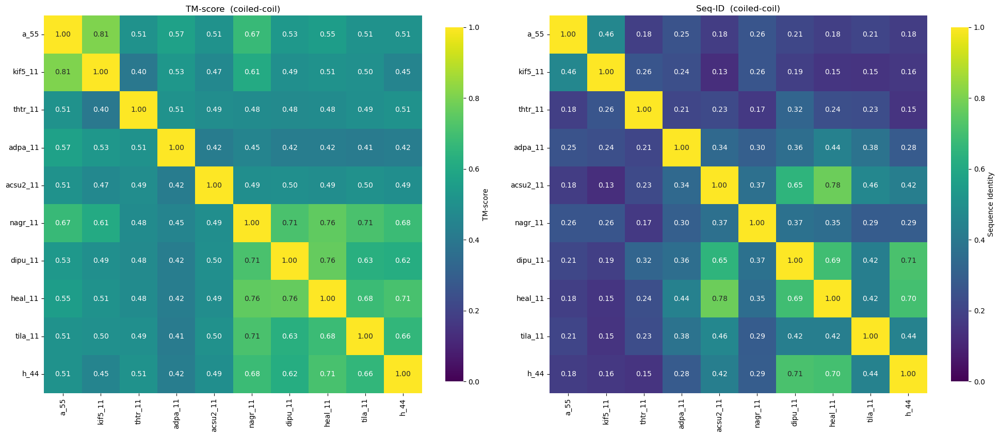


— full —


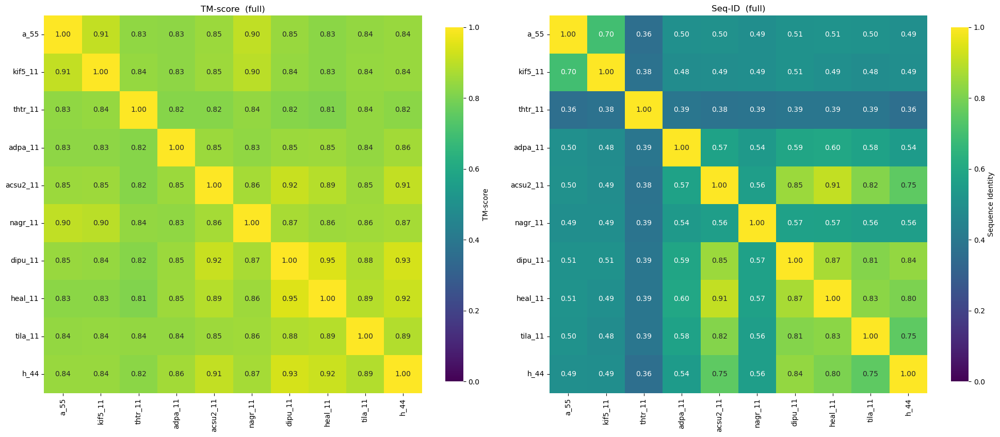


✓  Finished – trimmed PDBs in ../../data/3d_predictions/prodigy/trimmed_segments/<domain>/


In [4]:
#!/usr/bin/env python3
"""
Kinesin‑domain TM‑score & sequence‑identity pipeline
===================================================

* Reads a Clustal multiple alignment.
* Uses **a_55** as reference to map **modules** (1‑3) and **sub‑domains**.
* Enriches the alignment DataFrame (`ali_df`) with two extra columns:
      ‑  ali_df["Module"]    :  "module 1" / "module 2" / "module 3" / "-"
      ‑  ali_df["Subdomain"] :  the sub‑domain name (e.g. "b3‑ploop") or "-"
* The structural/heat‑map part is unchanged: exact AA lookup, trimming,
  USalign, TM‑score + Seq‑ID heat‑maps.

Copy‑&‑paste ready.
"""

# ---------------------------------------------------------------------
#  0.  USER FILES & CONSTANTS
# ---------------------------------------------------------------------
alignment_file = "../../../../Downloads/species"      # Clustal alignment
structure_paths = [
    "../../data/3d_predictions/prodigy/a_55.pdb",

    "../../data/3d_predictions/prodigy/kif5_11.cif",
    "../../data/3d_predictions/prodigy/thtr_11.cif",
    "../../data/3d_predictions/prodigy/adpa_11.cif",
    "../../data/3d_predictions/prodigy/acsu2_11.cif",
    "../../data/3d_predictions/prodigy/nagr_11.cif",
    "../../data/3d_predictions/prodigy/dipu_11.cif",
    "../../data/3d_predictions/prodigy/heal_11.cif",
    "../../data/3d_predictions/prodigy/tila_11.cif",

    # "../../data/3d_predictions/prodigy/b_345.pdb",
    # "../../data/3d_predictions/prodigy/c_123.pdb",
    # "../../data/3d_predictions/prodigy/d_55.pdb",
    # "../../data/3d_predictions/prodigy/e_234.pdb",
    # "../../data/3d_predictions/prodigy/f_456.pdb",
    # "../../data/3d_predictions/prodigy/g_123.pdb",

    "../../data/3d_predictions/prodigy/h_44.pdb",
]
ref_name = "a_55"                                    # reference sequence ID

# ---------------------------------------------------------------------
#  1.  DOMAIN & MODULE DEFINITIONS (UNGAPPED, REF = a_55)
# ---------------------------------------------------------------------
domain_def_ref = {
    # ---------- modules & full ---------------------------------------
    "full":       "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATE"
                  "RFVSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYL"
                  "VDLAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQ"
                  "ESLGGNARTTIVICCSPASFNESETKSTLDFGRRAKTVKNVVCVNEELTAEEWKRRYEKE"
                  "KEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL",
    "module 1":   "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATERF",
    "module 2":   "VSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYLVD"
                  "LAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQESL"
                  "GGNARTTIVICCSPASFNESETKSTLDFGRRAKTVK",
    "module 3":   "NVVCVNEELTAEEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDL"
                  "MEASTPNL",
    # ---------- sub‑domains ------------------------------------------
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5": "GVIGDSVKQG",
    "a2": "IIPRIVNDIFNHIYA",
    "b4": "LEFHIKVSYYEIY",
    "L8-b5": "KIRDLLDVSKVNLSVHEDKNRVPYV",
    "a3": "PEDVFEVIEEGKSNR",
    "L9-SwI": "HIAVTNMNEHSSRS",
    "b6": "HSVFLINVKQEN",
    "b7": "QKKLSGKLYLV",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12": "GNKTHIPYRDS",
    "a5": "KLTRILQES",
    "b8-a6": "RTTIVICC",
    "a6": "ESETKSTLDFGRRAKT",
    "neck": "ESETKSTLDFGRRAKTVKNVVCVNEELTAEEWKRRYEK",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# split dictionaries --------------------------------------------------
modules_def_ref  = {k: v for k, v in domain_def_ref.items()
                    if k in ("full", "module 1", "module 2", "module 3")}
subdom_def_ref   = {k: v for k, v in domain_def_ref.items()
                    if k not in modules_def_ref}

# ---------------------------------------------------------------------
#  2.  READ ALIGNMENT, MAP RANGES
# ---------------------------------------------------------------------
from Bio import AlignIO
print("· loading alignment …")
ali = AlignIO.read(alignment_file, "clustal")
ali_df = pd.DataFrame({rec.id: list(str(rec.seq)) for rec in ali})
if ref_name not in ali_df.columns:
    raise ValueError(f"Reference '{ref_name}' missing from alignment.")

ref_gapped   = ali_df[ref_name].tolist()
ungapped_idx = [i for i, aa in enumerate(ref_gapped) if aa != "-"]
ref_ungapped = "".join(aa for aa in ref_gapped if aa != "-")

def map_ranges(def_dict):
    rng = {}
    for name, subseq in def_dict.items():
        u0 = ref_ungapped.find(subseq)
        if u0 == -1:
            raise ValueError(f"Cannot map '{name}'")
        g0 = ungapped_idx[u0]
        g1 = ungapped_idx[u0 + len(subseq) - 1]
        rng[name] = (g0, g1)
    return rng

module_ranges   = map_ranges({k: v for k, v in modules_def_ref.items()
                              if k != "full"})       # exclude "full"
subdom_ranges   = map_ranges(subdom_def_ref)
domain_ranges   = {**module_ranges, **subdom_ranges, "full": map_ranges({"full": modules_def_ref["full"]})["full"]}

# ---------------------------------------------------------------------
#  3.  ADD "Module" & "Subdomain" COLUMNS TO ali_df
# ---------------------------------------------------------------------
module_labels    = ["-"] * len(ref_gapped)
for mod, (g0, g1) in module_ranges.items():
    for i in range(g0, g1 + 1):
        module_labels[i] = mod

subdom_labels    = ["-"] * len(ref_gapped)
for sd, (g0, g1) in subdom_ranges.items():
    for i in range(g0, g1 + 1):
        subdom_labels[i] = sd

ali_df.insert(0, "Module",    module_labels)
ali_df.insert(1, "Subdomain", subdom_labels)

# ---------------------------------------------------------------------
#  4.  BUILD per‑protein DOMAIN SEQ DICT (ungapped)
# ---------------------------------------------------------------------
protein_dom_seq = {}
for prot in ali_df.columns[2:]:               # skip Module/Subdomain cols
    d = {}
    for dom, (g0, g1) in domain_ranges.items():
        d[dom] = "".join(ali_df.loc[g0:g1, prot]).replace("-", "")
    protein_dom_seq[prot] = d

domain_list = list(domain_ranges.keys())

# ---------------------------------------------------------------------
#  5.  STRUCTURE HELPERS (unchanged)
# ---------------------------------------------------------------------
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select, Polypeptide
class Keep(Select):
    def __init__(self, keep): self.keep = keep
    def accept_residue(self, r): return r.get_parent().id == "A" and r.get_id() in self.keep

def chainA_sequence(path):
    parser = PDBParser(QUIET=True) if path.lower().endswith(".pdb") else MMCIFParser(QUIET=True)
    s = parser.get_structure("s", path)
    chain = s[0]["A"]
    seq, ids = [], []
    for res in chain:
        if Polypeptide.is_aa(res, standard=True):
            seq.append(Polypeptide.three_to_one(res.get_resname()))
            ids.append(res.get_id())
    return "".join(seq), ids

def save_trim(src, dst, keep_ids):
    parser = PDBParser(QUIET=True) if src.lower().endswith(".pdb") else MMCIFParser(QUIET=True)
    s = parser.get_structure("s", src)
    io = PDBIO(); io.set_structure(s); io.save(dst, Keep(keep_ids))

import functools, subprocess, numpy as np
@functools.lru_cache(maxsize=None)
def tm_score(p1, p2):
    out = subprocess.run(["USalign", p1, p2], stdout=subprocess.PIPE, text=True).stdout
    for ln in out.splitlines():
        if ln.startswith("TM-score="):
            try: return float(ln.split("=")[1].split()[0])
            except ValueError: break
    return np.nan

# ---------------------------------------------------------------------
#  6.  READ STRUCTURES
# ---------------------------------------------------------------------
structure_map = {os.path.splitext(os.path.basename(p))[0]: p for p in structure_paths}
structures    = [os.path.splitext(os.path.basename(p))[0] for p in structure_paths
                 if os.path.splitext(os.path.basename(p))[0] in protein_dom_seq]
seq_cache     = {prot: chainA_sequence(structure_map[prot]) for prot in structures}

# ---------------------------------------------------------------------
#  7.  MAIN LOOP – heat‑maps (unchanged logic)
# ---------------------------------------------------------------------
import matplotlib.pyplot as plt, seaborn as sns, os

for dom in domain_list:
    print(f"\n— {dom} —")
    g0, g1 = domain_ranges[dom]
    dom_align = ali_df.loc[g0:g1, structures]        # slice with Module/Subdomain removed

    # ---------- trim structures --------------------------------------
    trimmed = {}
    for prot in structures:
        dom_seq = protein_dom_seq[prot][dom]
        full_seq, ids = seq_cache[prot]
        idx = full_seq.find(dom_seq)
        if idx == -1:
            raise ValueError(f"{dom} not found in chain A of {prot}")
        keep_ids = set(ids[idx : idx + len(dom_seq)])
        out_dir  = f"../../data/3d_predictions/prodigy/trimmed_segments/{dom}"
        os.makedirs(out_dir, exist_ok=True)
        out_pdb  = os.path.join(out_dir, f"{prot}_{dom}.pdb")
        save_trim(structure_map[prot], out_pdb, keep_ids)
        trimmed[prot] = out_pdb

    # ---------- matrices --------------------------------------------
    tm_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)
    id_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)

    for i, a in enumerate(structures):
        for j, b in enumerate(structures):
            if j < i:
                tm_mat.iat[i, j] = tm_mat.iat[j, i]
                id_mat.iat[i, j] = id_mat.iat[j, i]
                continue
            col_a, col_b = dom_align[a], dom_align[b]
            mask = (col_a != '-') & (col_b != '-')
            id_mat.iat[i, j] = ((col_a == col_b) & mask).sum() / mask.sum() if mask.any() else np.nan
            tm_mat.iat[i, j] = tm_score(trimmed[a], trimmed[b])

    # ---------- plot -------------------------------------------------
    plt.figure(figsize=(20, 9))
    plt.subplot(1, 2, 1)
    sns.heatmap(tm_mat, annot=True, fmt=".2f", cmap="viridis",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "TM‑score", "shrink": 0.8})
    plt.title(f"TM‑score  ({dom})")
    plt.subplot(1, 2, 2)
    sns.heatmap(id_mat, annot=True, fmt=".2f", cmap="viridis",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "Sequence Identity", "shrink": 0.8})
    plt.title(f"Seq‑ID  ({dom})")
    plt.tight_layout()
    plt.show()
    plt.close()

print("\n✓  Finished – trimmed PDBs in ../../data/3d_predictions/prodigy/trimmed_segments/<domain>/")

# ---------------------------------------------------------------------
#  8.  OPTIONAL – inspect the enriched alignment DataFrame
# ---------------------------------------------------------------------
# print(ali_df.head(30))  # uncomment to preview Module / Subdomain labels

· loading alignment …


/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warnings.warn(
/Users/dalarios/anaconda3/lib/python3.11/site-packages/Bio/PDB/Polypeptide.py:144: BiopythonDeprecationWarning: 'three_to_one' will be deprecated in a future release of Biopython in favor of 'Bio.PDB.Polypeptide.protein_letters_3to1'.
  warning


— module 1 —


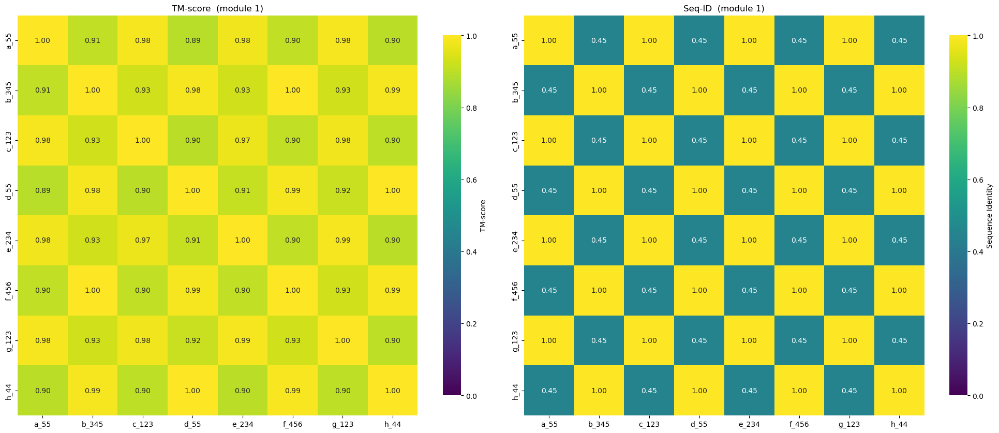


— module 2 —


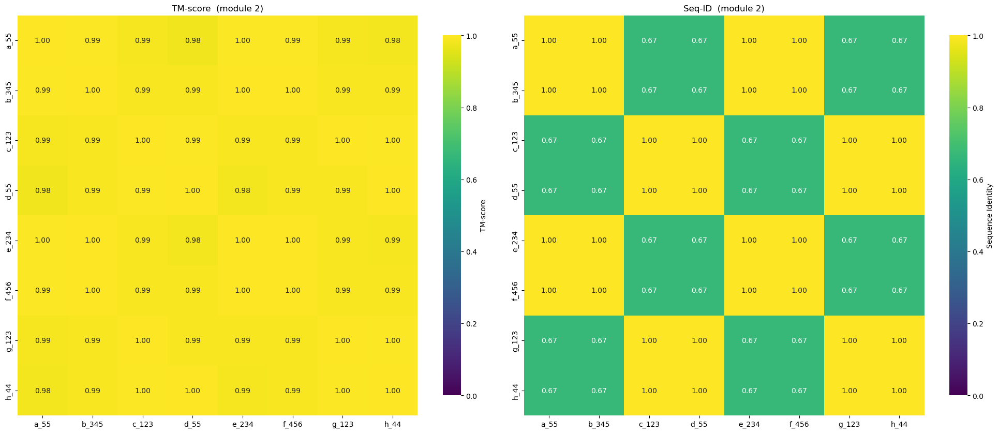


— module 3 —


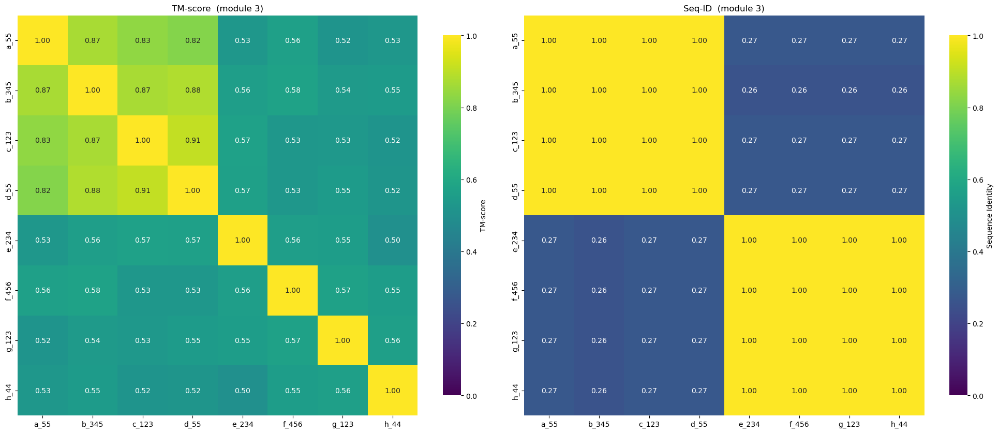


— b0-a0 —


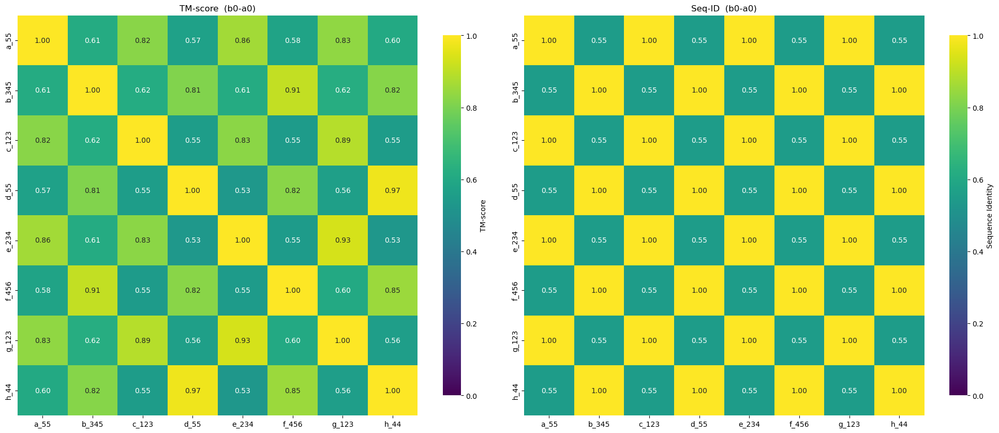


— b2 —


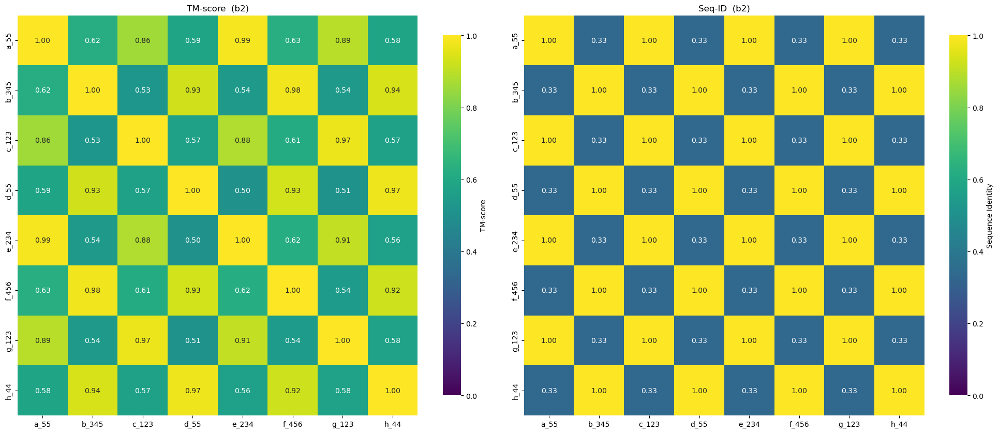


— a1 —


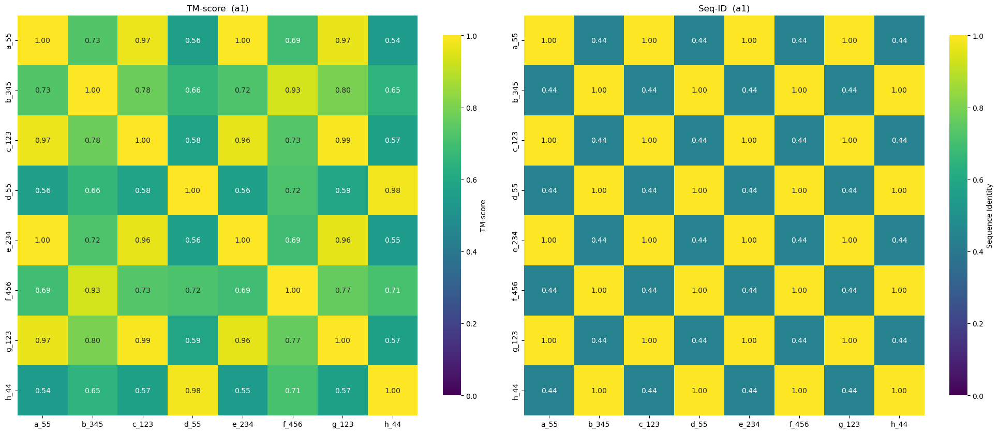


— b3-ploop —


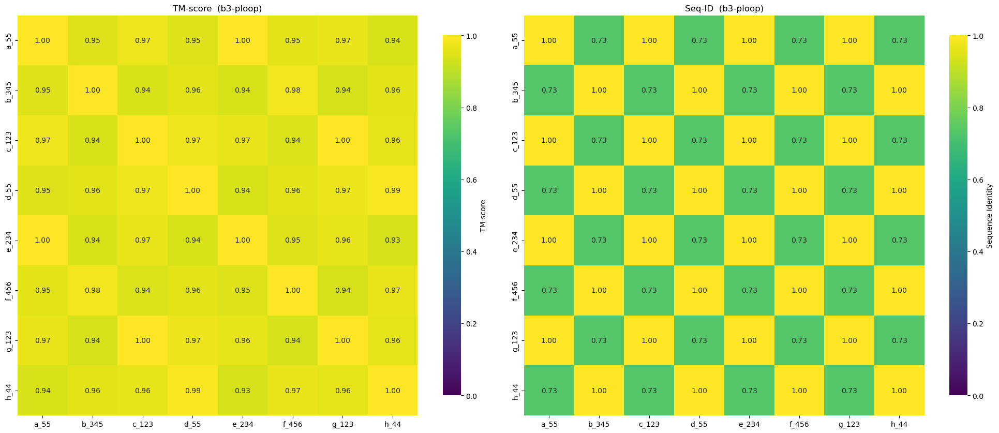


— L5 —


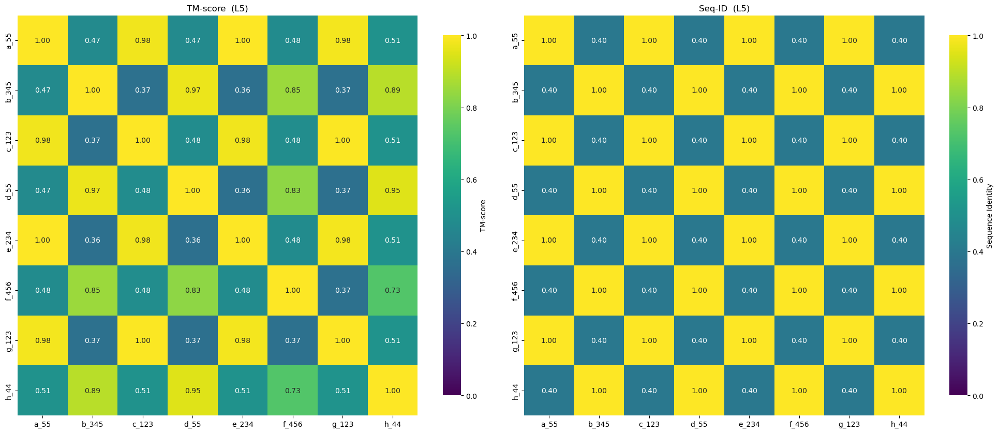


— a2 —


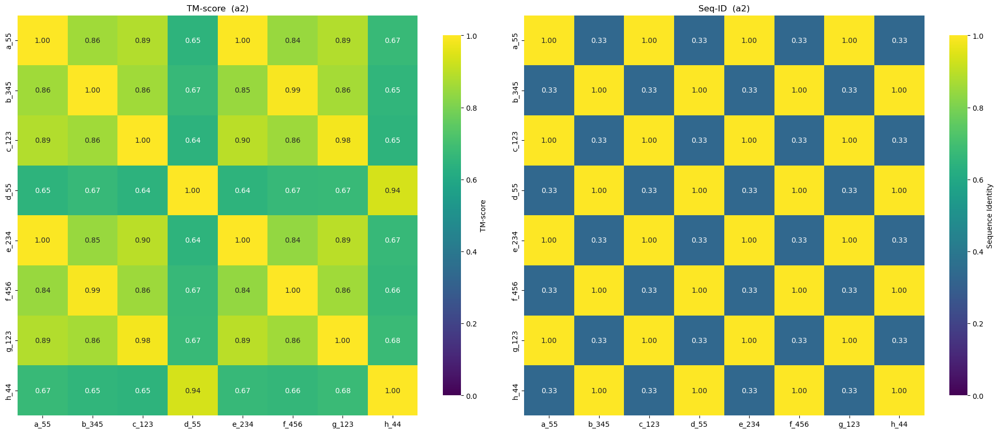


— b4 —


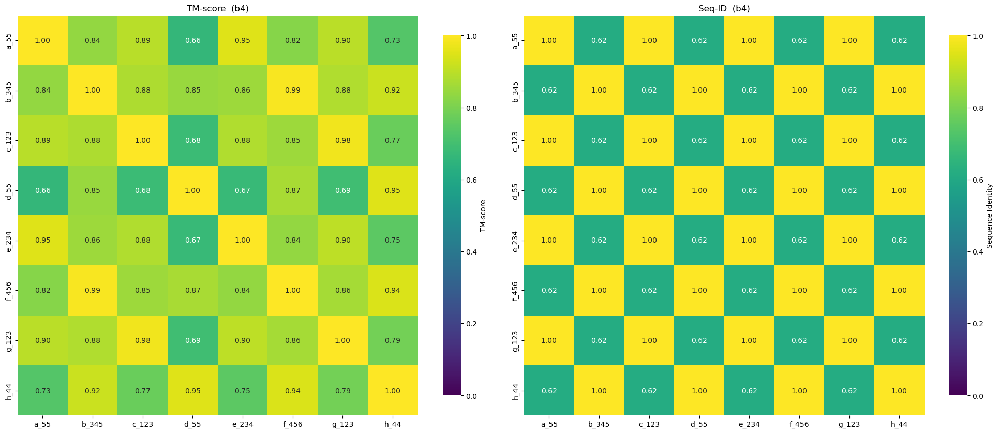


— L8-b5 —


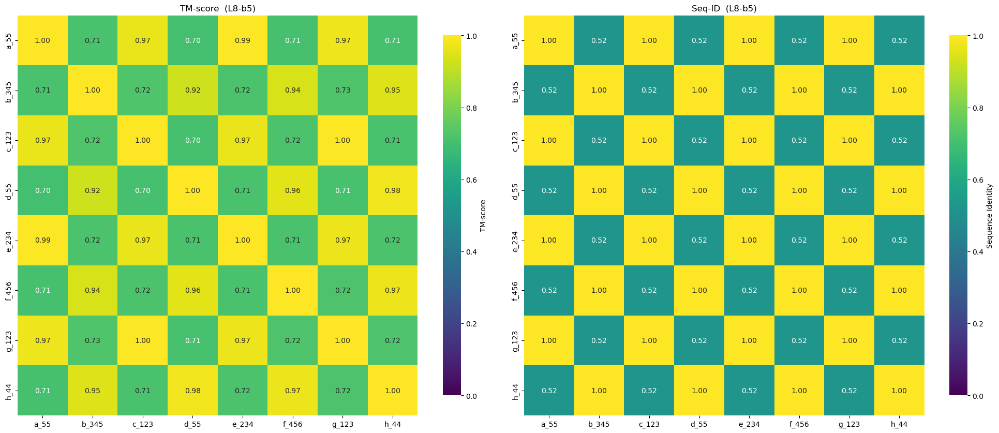


— a3 —


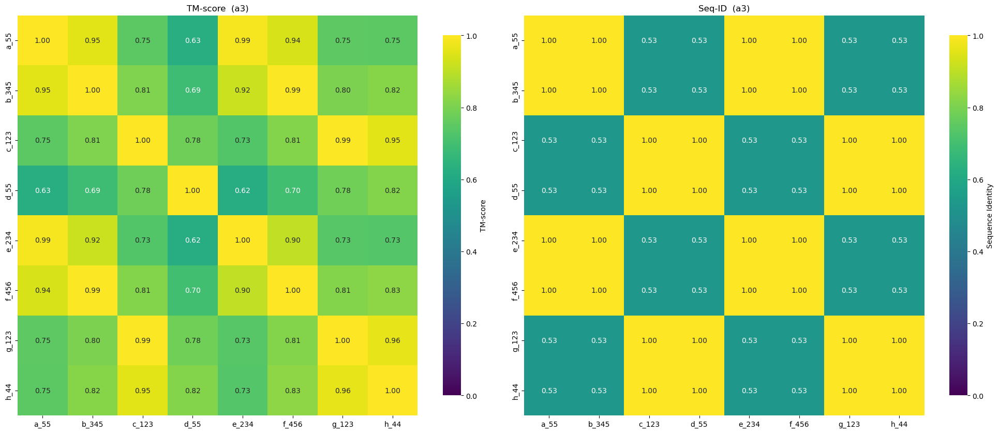


— L9-SwI —


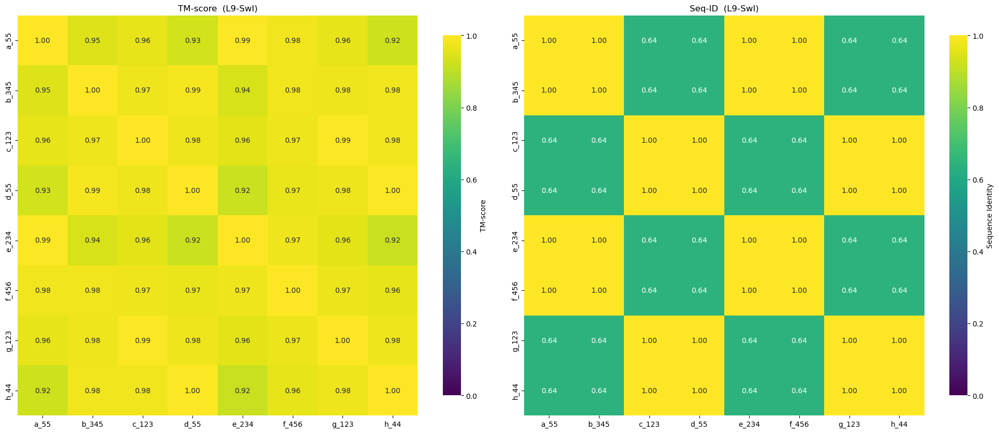


— b6 —


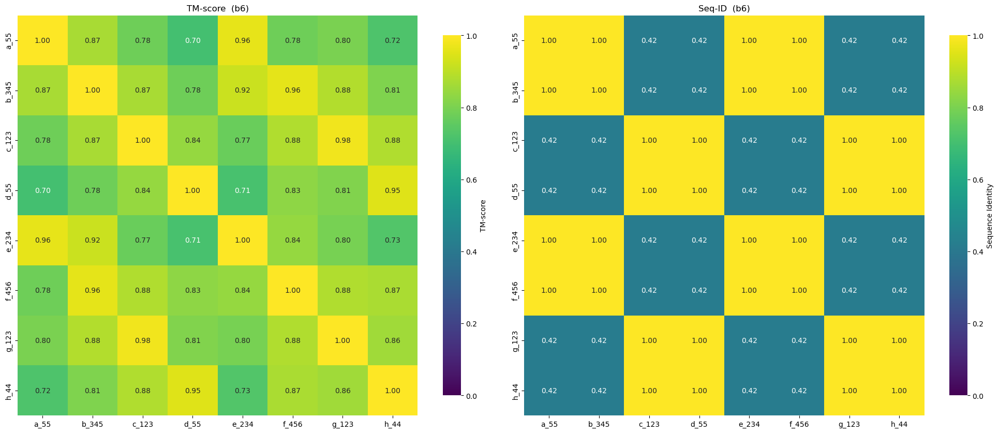


— b7 —


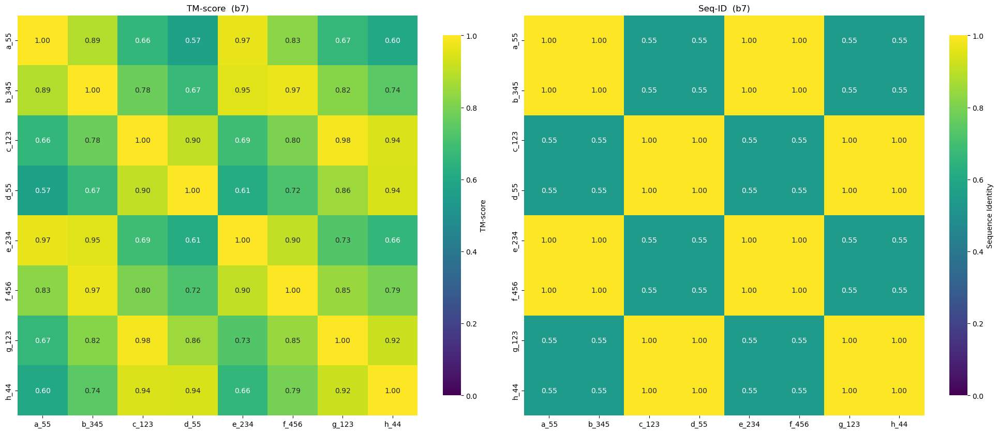


— L11-SwII —


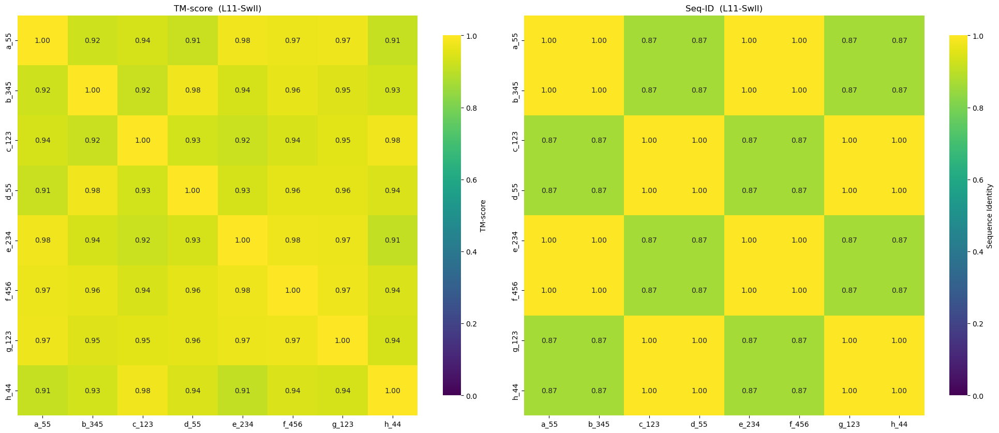


— a4 —


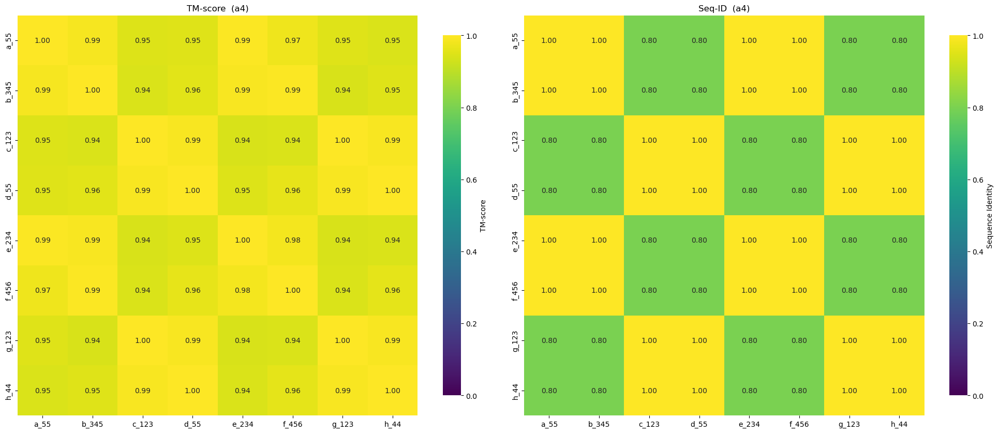


— L12 —


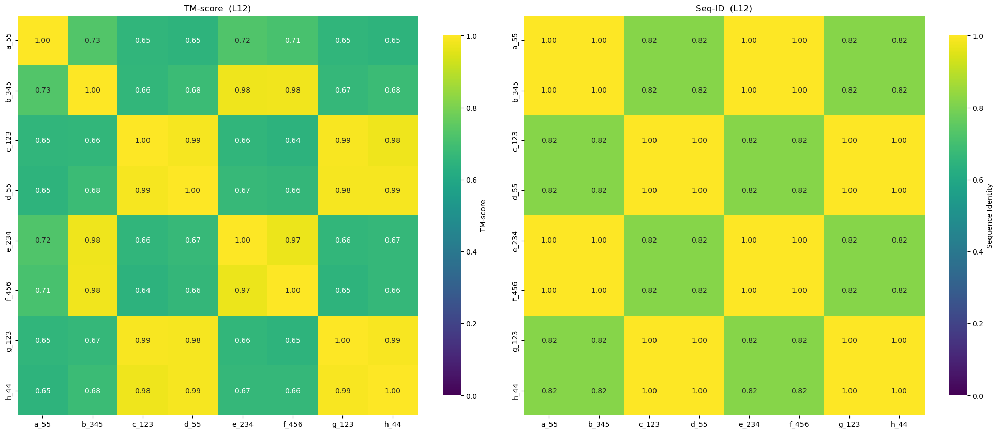


— a5 —


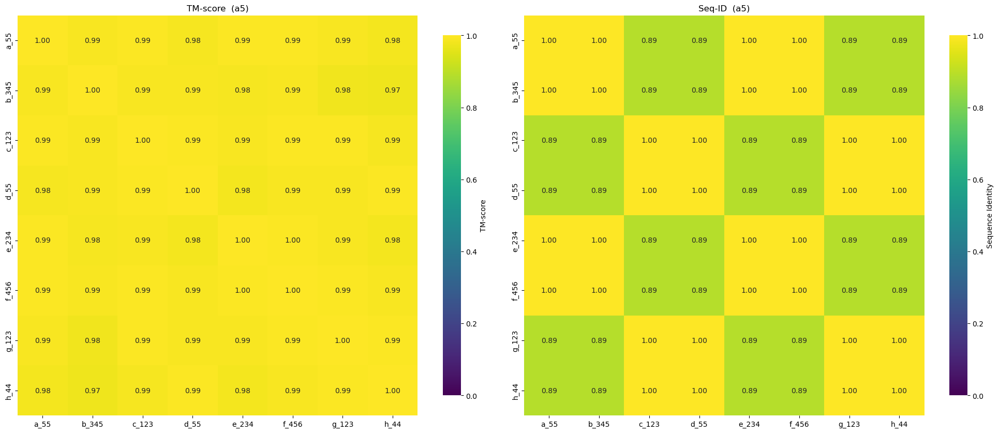


— b8-a6 —


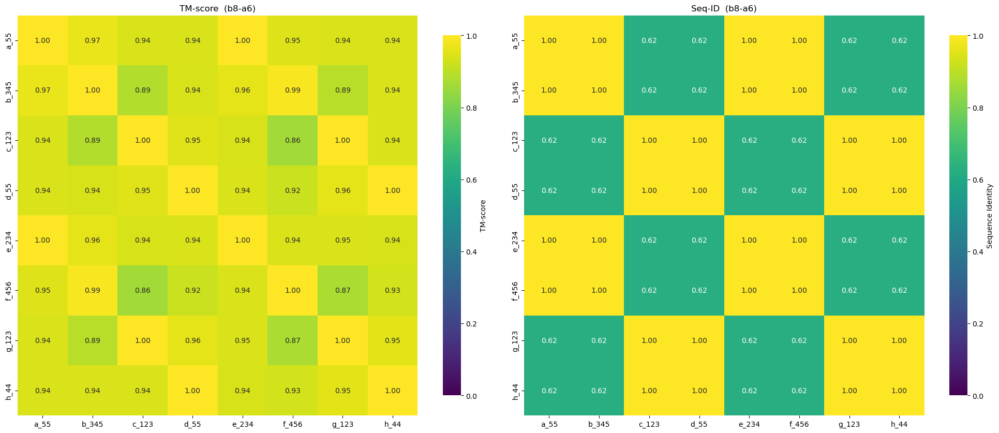


— a6 —


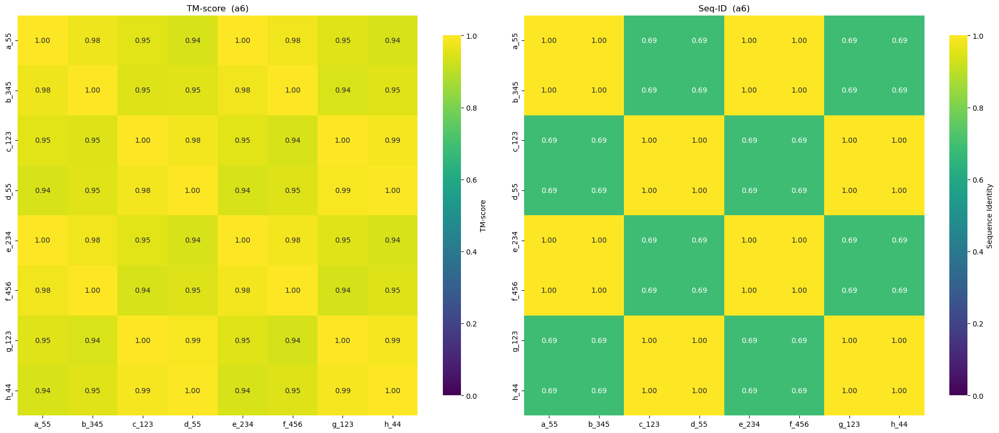


— neck —


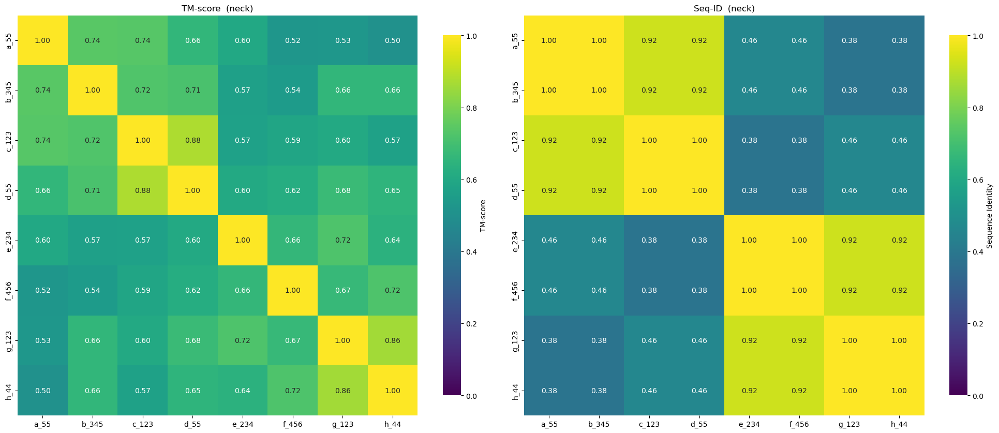


— coiled-coil —


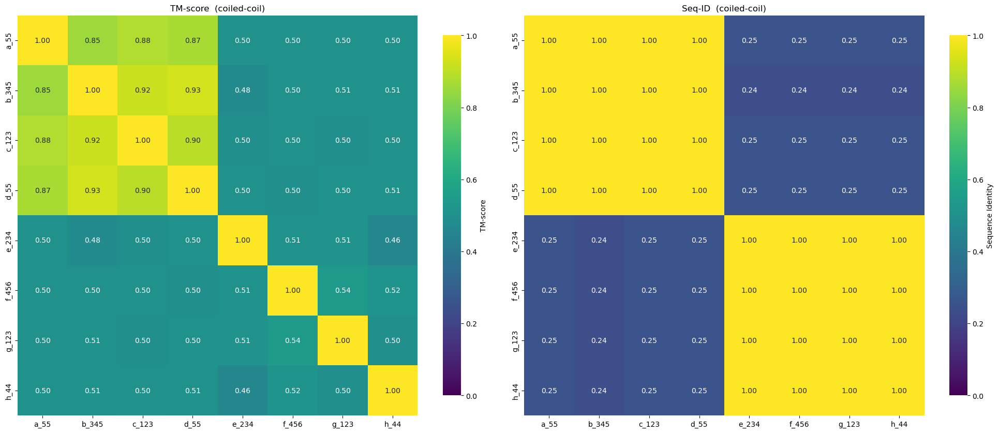


— full —


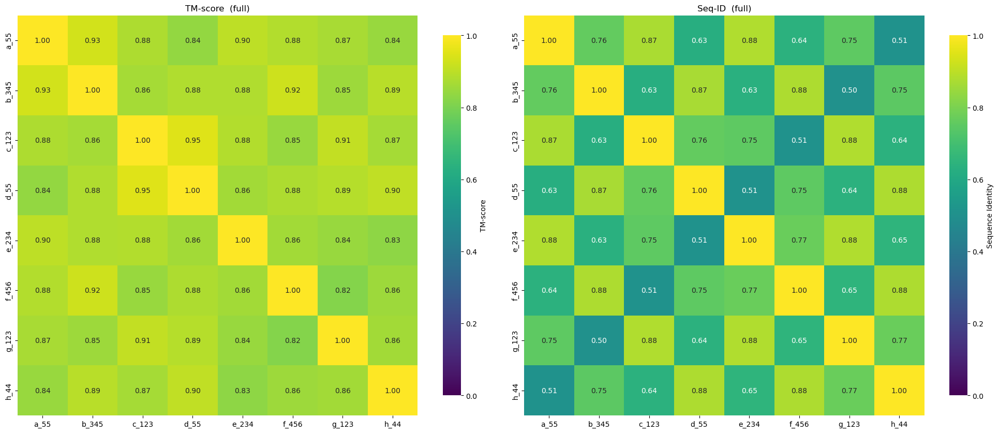


✓  Finished – trimmed PDBs in ../../data/3d_predictions/prodigy/trimmed_segments/<domain>/


In [4]:
#!/usr/bin/env python3
"""
Kinesin‑domain TM‑score & sequence‑identity pipeline
===================================================

* Reads a Clustal multiple alignment.
* Uses **a_55** as reference to map **modules** (1‑3) and **sub‑domains**.
* Enriches the alignment DataFrame (`ali_df`) with two extra columns:
      ‑  ali_df["Module"]    :  "module 1" / "module 2" / "module 3" / "-"
      ‑  ali_df["Subdomain"] :  the sub‑domain name (e.g. "b3‑ploop") or "-"
* The structural/heat‑map part is unchanged: exact AA lookup, trimming,
  USalign, TM‑score + Seq‑ID heat‑maps.

Copy‑&‑paste ready.
"""

# ---------------------------------------------------------------------
#  0.  USER FILES & CONSTANTS
# ---------------------------------------------------------------------
alignment_file = "../../../../Downloads/chimeras"      # Clustal alignment
structure_paths = [
    "../../data/3d_predictions/prodigy/a_55.pdb",
    
    # "../../data/3d_predictions/prodigy/kif5_11.cif",
    # "../../data/3d_predictions/prodigy/thtr_11.cif",
    # "../../data/3d_predictions/prodigy/adpa_11.cif",
    # "../../data/3d_predictions/prodigy/nagr_11.cif",
    # "../../data/3d_predictions/prodigy/acsu2_11.cif",
    # "../../data/3d_predictions/prodigy/dipu_11.cif",
    # "../../data/3d_predictions/prodigy/heal_11.cif",
    # "../../data/3d_predictions/prodigy/tila_11.cif",

    "../../data/3d_predictions/prodigy/b_345.pdb",
    "../../data/3d_predictions/prodigy/c_123.pdb",
    "../../data/3d_predictions/prodigy/d_55.pdb",
    "../../data/3d_predictions/prodigy/e_234.pdb",
    "../../data/3d_predictions/prodigy/f_456.pdb",
    "../../data/3d_predictions/prodigy/g_123.pdb",

    "../../data/3d_predictions/prodigy/h_44.pdb",
]
ref_name = "a_55"                                    # reference sequence ID

# ---------------------------------------------------------------------
#  1.  DOMAIN & MODULE DEFINITIONS (UNGAPPED, REF = a_55)
# ---------------------------------------------------------------------
domain_def_ref = {
    # ---------- modules & full ---------------------------------------
    "full":       "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATE"
                  "RFVSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYL"
                  "VDLAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQ"
                  "ESLGGNARTTIVICCSPASFNESETKSTLDFGRRAKTVKNVVCVNEELTAEEWKRRYEKE"
                  "KEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL",
    "module 1":   "MSAEREIPAEDSIKVVCRFRPLNDSEEKAGSKFVVKFPNNVEENCISIAGKVYLFDKVF"
                  "KPNASQEKVYNEAAKSIVTDVLAGYNGTIFAYGQTSSGKTHTMEGVIGDSVKQGIIPRI"
                  "VNDIFNHIYAMEVNLEFHIKVSYYEIYMDKIRDLLDVSKVNLSVHEDKNRVPYVKGATERF",
    "module 2":   "VSSPEDVFEVIEEGKSNRHIAVTNMNEHSSRSHSVFLINVKQENLENQKKLSGKLYLVD"
                  "LAGSEKVSKTGAEGTVLDEAKNINKSLSALGNVISALADGNKTHIPYRDSKLTRILQESL"
                  "GGNARTTIVICCSPASFNESETKSTLDFGRRAKTVK",
    "module 3":   "NVVCVNEELTAEEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDL"
                  "MEASTPNL",
    # ---------- sub‑domains ------------------------------------------
    "b0-a0": "AEDSIKVVCRFRPLNDSEEKA",
    "b2": "CISIAGKVYLFDKVF",
    "a1": "QEKVYNEAAKSIVTDVLA",
    "b3-ploop": "GTIFAYGQTSSGKTH",
    "L5": "GVIGDSVKQG",
    "a2": "IIPRIVNDIFNHIYA",
    "b4": "LEFHIKVSYYEIY",
    "L8-b5": "KIRDLLDVSKVNLSVHEDKNRVPYV",
    "a3": "PEDVFEVIEEGKSNR",
    "L9-SwI": "HIAVTNMNEHSSRS",
    "b6": "HSVFLINVKQEN",
    "b7": "QKKLSGKLYLV",
    "L11-SwII": "DLAGSEKVSKTGAEG",
    "a4": "TVLDEAKNINKSLSALGNVISALAD",
    "L12": "GNKTHIPYRDS",
    "a5": "KLTRILQES",
    "b8-a6": "RTTIVICC",
    "a6": "ESETKSTLDFGRRAKT",
    "neck": "VKNVVCVNEELTA",
    "coiled-coil": "EEWKRRYEKEKEKNARLKGKVEKLEIELARWRAGETVKAEEQINMEDLMEASTPNL"
}

# split dictionaries --------------------------------------------------
modules_def_ref  = {k: v for k, v in domain_def_ref.items()
                    if k in ("full", "module 1", "module 2", "module 3")}
subdom_def_ref   = {k: v for k, v in domain_def_ref.items()
                    if k not in modules_def_ref}

# ---------------------------------------------------------------------
#  2.  READ ALIGNMENT, MAP RANGES
# ---------------------------------------------------------------------
from Bio import AlignIO
print("· loading alignment …")
ali = AlignIO.read(alignment_file, "clustal")
ali_df = pd.DataFrame({rec.id: list(str(rec.seq)) for rec in ali})
if ref_name not in ali_df.columns:
    raise ValueError(f"Reference '{ref_name}' missing from alignment.")

ref_gapped   = ali_df[ref_name].tolist()
ungapped_idx = [i for i, aa in enumerate(ref_gapped) if aa != "-"]
ref_ungapped = "".join(aa for aa in ref_gapped if aa != "-")

def map_ranges(def_dict):
    rng = {}
    for name, subseq in def_dict.items():
        u0 = ref_ungapped.find(subseq)
        if u0 == -1:
            raise ValueError(f"Cannot map '{name}'")
        g0 = ungapped_idx[u0]
        g1 = ungapped_idx[u0 + len(subseq) - 1]
        rng[name] = (g0, g1)
    return rng

module_ranges   = map_ranges({k: v for k, v in modules_def_ref.items()
                              if k != "full"})       # exclude "full"
subdom_ranges   = map_ranges(subdom_def_ref)
domain_ranges   = {**module_ranges, **subdom_ranges, "full": map_ranges({"full": modules_def_ref["full"]})["full"]}

# ---------------------------------------------------------------------
#  3.  ADD "Module" & "Subdomain" COLUMNS TO ali_df
# ---------------------------------------------------------------------
module_labels    = ["-"] * len(ref_gapped)
for mod, (g0, g1) in module_ranges.items():
    for i in range(g0, g1 + 1):
        module_labels[i] = mod

subdom_labels    = ["-"] * len(ref_gapped)
for sd, (g0, g1) in subdom_ranges.items():
    for i in range(g0, g1 + 1):
        subdom_labels[i] = sd

ali_df.insert(0, "Module",    module_labels)
ali_df.insert(1, "Subdomain", subdom_labels)

# ---------------------------------------------------------------------
#  4.  BUILD per‑protein DOMAIN SEQ DICT (ungapped)
# ---------------------------------------------------------------------
protein_dom_seq = {}
for prot in ali_df.columns[2:]:               # skip Module/Subdomain cols
    d = {}
    for dom, (g0, g1) in domain_ranges.items():
        d[dom] = "".join(ali_df.loc[g0:g1, prot]).replace("-", "")
    protein_dom_seq[prot] = d

domain_list = list(domain_ranges.keys())

# ---------------------------------------------------------------------
#  5.  STRUCTURE HELPERS (unchanged)
# ---------------------------------------------------------------------
from Bio.PDB import PDBParser, MMCIFParser, PDBIO, Select, Polypeptide
class Keep(Select):
    def __init__(self, keep): self.keep = keep
    def accept_residue(self, r): return r.get_parent().id == "A" and r.get_id() in self.keep

def chainA_sequence(path):
    parser = PDBParser(QUIET=True) if path.lower().endswith(".pdb") else MMCIFParser(QUIET=True)
    s = parser.get_structure("s", path)
    chain = s[0]["A"]
    seq, ids = [], []
    for res in chain:
        if Polypeptide.is_aa(res, standard=True):
            seq.append(Polypeptide.three_to_one(res.get_resname()))
            ids.append(res.get_id())
    return "".join(seq), ids

def save_trim(src, dst, keep_ids):
    parser = PDBParser(QUIET=True) if src.lower().endswith(".pdb") else MMCIFParser(QUIET=True)
    s = parser.get_structure("s", src)
    io = PDBIO(); io.set_structure(s); io.save(dst, Keep(keep_ids))

import functools, subprocess, numpy as np
@functools.lru_cache(maxsize=None)
def tm_score(p1, p2):
    out = subprocess.run(["USalign", p1, p2], stdout=subprocess.PIPE, text=True).stdout
    for ln in out.splitlines():
        if ln.startswith("TM-score="):
            try: return float(ln.split("=")[1].split()[0])
            except ValueError: break
    return np.nan

# ---------------------------------------------------------------------
#  6.  READ STRUCTURES
# ---------------------------------------------------------------------
structure_map = {os.path.splitext(os.path.basename(p))[0]: p for p in structure_paths}
structures    = [os.path.splitext(os.path.basename(p))[0] for p in structure_paths
                 if os.path.splitext(os.path.basename(p))[0] in protein_dom_seq]
seq_cache     = {prot: chainA_sequence(structure_map[prot]) for prot in structures}

# ---------------------------------------------------------------------
#  7.  MAIN LOOP – heat‑maps (unchanged logic)
# ---------------------------------------------------------------------
import matplotlib.pyplot as plt, seaborn as sns, os

for dom in domain_list:
    print(f"\n— {dom} —")
    g0, g1 = domain_ranges[dom]
    dom_align = ali_df.loc[g0:g1, structures]        # slice with Module/Subdomain removed

    # ---------- trim structures --------------------------------------
    trimmed = {}
    for prot in structures:
        dom_seq = protein_dom_seq[prot][dom]
        full_seq, ids = seq_cache[prot]
        idx = full_seq.find(dom_seq)
        if idx == -1:
            raise ValueError(f"{dom} not found in chain A of {prot}")
        keep_ids = set(ids[idx : idx + len(dom_seq)])
        out_dir  = f"../../data/3d_predictions/prodigy/trimmed_segments/{dom}"
        os.makedirs(out_dir, exist_ok=True)
        out_pdb  = os.path.join(out_dir, f"{prot}_{dom}.pdb")
        save_trim(structure_map[prot], out_pdb, keep_ids)
        trimmed[prot] = out_pdb

    # ---------- matrices --------------------------------------------
    tm_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)
    id_mat = pd.DataFrame(index=structures, columns=structures, dtype=float)

    for i, a in enumerate(structures):
        for j, b in enumerate(structures):
            if j < i:
                tm_mat.iat[i, j] = tm_mat.iat[j, i]
                id_mat.iat[i, j] = id_mat.iat[j, i]
                continue
            col_a, col_b = dom_align[a], dom_align[b]
            mask = (col_a != '-') & (col_b != '-')
            id_mat.iat[i, j] = ((col_a == col_b) & mask).sum() / mask.sum() if mask.any() else np.nan
            tm_mat.iat[i, j] = tm_score(trimmed[a], trimmed[b])

    # ---------- plot -------------------------------------------------
    plt.figure(figsize=(20, 9))
    plt.subplot(1, 2, 1)
    sns.heatmap(tm_mat, annot=True, fmt=".2f", cmap="viridis",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "TM‑score", "shrink": 0.8})
    plt.title(f"TM‑score  ({dom})")
    plt.subplot(1, 2, 2)
    sns.heatmap(id_mat, annot=True, fmt=".2f", cmap="viridis",
                vmin=0, vmax=1, square=True, cbar_kws={"label": "Sequence Identity", "shrink": 0.8})
    plt.title(f"Seq‑ID  ({dom})")
    plt.tight_layout()
    plt.show()
    plt.close()

print("\n✓  Finished – trimmed PDBs in ../../data/3d_predictions/prodigy/trimmed_segments/<domain>/")

# ---------------------------------------------------------------------
#  8.  OPTIONAL – inspect the enriched alignment DataFrame
# ---------------------------------------------------------------------
# print(ali_df.head(30))  # uncomment to preview Module / Subdomain labels

In [6]:
df_final

NameError: name 'df_final' is not defined